<img src="../figures/header.jpg" style="display:block; margin:auto; width:55%; height:210px;">

<br><br> 

<p style="text-align:center; background-color: darkgray; color: lightyellow; border-radius:10px; line-height:1.4; font-size:32px; font-weight:bold; padding: 9px;">
            <strong>Dog Breed Image Classification</strong>
</p>  
  
<p style="text-align:center; color: Black; border-radius:10px; font-family:helvetica; line-height:1.0; font-size:28px; font-weight:normal; text-transform: capitalize; padding: 5px;">
    End-to-end Deep Learning Project for
    <br>Dog Breed Multi-Class Image Classification:
    <br>EDA, Transfer Learning, Fine-Tuning, and Model Deployment
</p>    

# 1. Introduction

## 1.1 Background

In recent years, the canine population has witnessed a surge in the number of mixed-breed dogs. While the charm of mixed-breed dogs lies in their one-of-a-kind characteristics, the increasing variety poses challenges when it comes to identifying their specific breeds. This is where a classification model proves to be invaluable.

Creating a classification model for identifying breeds of dogs can serve various purposes including:
- Lost and found services to help efficiently reunite lost dogs with owners.
- Educational tools through interactive websites or mobile applications to learn about different breeds.
- Pet adoption platforms to identify breeds within shelters, enhancing adoptiong and rehoming processes.
- Dog shows and competitions to assist judges in verifying participating dog breeds.

The following study explores the multi-class [stanford dogs image dataset](https://www.kaggle.com/datasets/jessicali9530/stanford-dogs-dataset), then uses transfer learning to train and fine-tune four modern neural network architectures. We'll use built-in [Keras applications](https://keras.io/api/applications) to use architectures with pre-trained ImageNet weights for the following models: 
- [xception](https://arxiv.org/abs/1610.02357)
- [InceptionResNetV2](https://arxiv.org/abs/1602.07261)
- [EfficientNetB3](https://arxiv.org/abs/1905.11946)
- [ConvNeXtSmall](https://arxiv.org/abs/2201.03545)

Finally, we'll save the best model with tensorflow lite, create a docker image for the environment with minimized dependencies, and deploy it to the cloud using AWS Lambda.

**WARNING**: Do not attempt to run the enitre notebook without a CUDA-enabled GPU. The models may take hours or even days to train. See section 3.2 for more information on how to check for an available GPU.

## 1.2 Table of Contents.

### 1. Introduction
- 1.1 - Description of the project methodology and real world use-case.
- 1.2 - Table of contents **(We Are Here)**
- 1.3 - Repository structure
- 1.4 - Dataset source and information.
### 2. Dependency Management
- 2.1 - Includes instructions and code-blocks for both creating and running the conda environment, including tensorflow installation.
- 2.2 - Import statements for all dependencies. This section **must** be run before executing the rest of the project.
- 2.3 - Check for GPU available on Tensorflow
   - Please check that all output on your local machine before proceeding.
### 3. EDA and Data Prep
- 3.1 - Preparing the data for Keras model training
   - Run this section before proceeding.
- 3.2 - Exploring the stanford dogs dataset
### 4. Modeling
- 4.1 - Helper functions for compiling models and plotting output. This section must be run before any of 5.2 through 5.6.
- Training, fine-tuning and saving models for:
    - 4.2 - xception
    - 4.3 - InceptionResNetV2
    - 4.4 - EfficientNetB3
    - 4.5 - ConvNeXtSmall
- 4.6 - Comparison and analysis of all four tuned models to determine the final model: EfficientNetB3V2
- 4.7 - Save trained EfficientNetB3V2 model to tflite for deployment
### 5. Serverless AWS Deployment
   - 5.1 - Local deployment with docker
   - 5.2 - Cloud deployment with AWS Lambda and Streamlit
### 6. Kubernetes Deployment
   - 6.1 - Local deployment with docker
### 7. Application Deployment
   - 7.1 - Application deployment with streamlit
### 8. References
   - References for all model architectures and Keras documentation

## 1.3 Repository Structure
```
dog-prediction
│   README.md
|   Dockerfile - Set up environment with minimized dependencies for local and cloud deployment
│   requirements.txt - Set up local environment for running notebook
│
└───data - Unzip the dataset to this folder (section 2.3)
│   
└───figures - Contains images for the notebook and readme
|
└───models
|   │   effnetV2B3_model.keras
|   │   Xception_model.keras
|   │   model.tflite - Minimized dependencies for local and cloud deployment
|   │   converted_model - Tensorflow model for kubernetes deployment with tf-serving
|
└───python
|   │   convnext.py - Hotfix for saving convnext models with tensorflow 2.10
|   │   lambda_function.py - Function for AWS Lambda cloud deployment
|   │   notebook.ipynb - EDA, modeling and hyperparameter tuning - training output removed
|   │   notebook-orig.ipynb - EDA, modeling and hyperparameter tuning - training output kept
|   │   test.py - Tests serverless local and cloud inference
|   │   streamlit_app.py - Application for streamlit cloud
|
└───kubernetes
    │   docker-compose.yaml - Docker Compose file for setting up multi-container network
    │   image-gateway.dockerfile - Dockerfile for running gateway container to post predictions to the model
    │   image-model.dockerfile - Dockerfile for running model container to accept posts for predictions
    │   Pipfile - Pipfile for building gateway container environment
    │   Pipfile.lock - Pipfile lock for building gateway container environment
    │   gateway.py - Flask application that connects to tf-serving model
    │   proto.py - Converts model to proto for efficient deployment and inference
    │   test.py - Tests kubernetes local and cloud inference

```

## 1.4 Dataset Source

The Stanford Dogs dataset contain images of dogs from around the world. It is primarily used for image categorization of dog breeds. The version for this project can be downloaded from [Kaggle - Stanford Dogs Dataset](https://www.kaggle.com/datasets/jessicali9530/stanford-dogs-dataset).
- Dog breeds: 120
- Number of images: 20,580
- This project uses the "Images" folder which is divided into subfolders by class (dog breed)

Further observation of the data can be found in section 3.2 EDA

# 2. Dependency Management

## 2.1 Environment Installation

### Creating conda environment from requirements.txt
The following will create a conda environment with the necessary requirements for this project. The following code is **not executable** within this notebook, but should be run prior to opening the notebook.

``conda create --name dog-prediction python=3.10``

``conda activate dog-prediction``

``pip install -r requirements.txt``

This project was created with tensorflow 2.10.0 with GPU support for windows cuda tool kit 11.2 and nvidia cuda-nvcc. The tensorflow installation for your OS may be different. Please refer to the [official documentation](https://www.tensorflow.org/install/pip). For a windows build with a cuda-enabled nvidia graphics card, please run the following commands.

In [ ]:
!conda install -c conda-forge cudatoolkit=11.2 cudnn=8.1.0
!conda install -c nvidia cuda-nvcc

### Writing requirements.txt or environment.yml
If needed, the requirements file can be re-written to the root of the repository with the following command.

``pip3 freeze > ../requirements.txt``

## 2.2 Import Statements

The following can be installed with a conda environment with requirements.txt, a pipenvironment with pipenv, or a docker environment with Dockerfile from section 2. Environment Management. Ensure that your python version and package versions match the following notebook output before proceeding, as some versions of python, scikit-learn and tensorflow are incompatible with the project.

In [1]:
import numpy as np
import polars as pl 
import scipy
from scipy.stats import kurtosis, skew

import matplotlib as mpl
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import load_img, ImageDataGenerator
from keras import layers
import tensorflow.lite as tflite

# fixed functionality to save convnext models
import convnext

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, recall_score, precision_score, f1_score
#from sklearn.model_selection import StratifiedKFold

import os
from time import time
from datetime import datetime

In [2]:
import session_info
session_info.show(html=False)

-----
convnext            NA
keras               2.10.0
matplotlib          3.8.2
numpy               1.26.3
polars              0.20.5
scipy               1.12.0
session_info        1.0.0
sklearn             1.4.0
tensorflow          2.10.0
-----
IPython             8.20.0
jupyter_client      8.6.0
jupyter_core        5.7.1
jupyterlab          4.0.11
-----
Python 3.10.13 | packaged by Anaconda, Inc. | (main, Sep 11 2023, 13:24:38) [MSC v.1916 64 bit (AMD64)]
Windows-10-10.0.19045-SP0
-----
Session information updated at 2024-01-25 15:30


## 2.3 GPU Availability

We also want to check that there is CUDA-enabled GPU on the current system. If the following output does not show a GPU device for your system, do **NOT** attempt to run the full notebook.

In [3]:
print("Available devices:")

for i, device in enumerate(tf.config.list_logical_devices()):
    print(f"{i}) {device}")

Available devices:
0) LogicalDevice(name='/device:CPU:0', device_type='CPU')
1) LogicalDevice(name='/device:GPU:0', device_type='GPU')


# 3. EDA and Data Prep

## 3.1 Data Prep

- Keras ImageDataGenerator from images directory
- Use scikit-learn train-test split into 80% train, 20% test data for final model comparison
- Further split train data into 80% train, 20% validation for hyperparameter tuning
- Convert 1D labels into one-hot arrays as the correct input format for Keras model training and testing
- We split the data twice:
  - First data split with smaller images (150x150) for faster hyperparameter tuning
  - Second data split with larger images (299x299) for final performance metrics and comparison between models

In [4]:
fpath = os.path.join('..', 'data', 'images', 'Images')
categories = os.listdir(fpath)
categories = [' '.join(' '.join(i.split('-')[1:]).split('_')).capitalize() for i in categories]

**First data split with smaller images (150x150) for faster hyperparameter tuning**

In [5]:
# use a keras generator to process all images in the directory
train_gen = ImageDataGenerator()

# gather all data from directories with small image size for efficient hyperparameter tuning
all_data = train_gen.flow_from_directory(
    fpath,
    target_size=(150, 150),
    batch_size=20580,
    shuffle=False
)
X, y = all_data.next()

# hold out 20% for testing at the end
X_train_hold, X_test, y_train_hold, y_test = train_test_split(X, all_data.labels, test_size=0.2, random_state=42)

# hold out 20% for validation during hyperparameter tuning
X_train, X_val, y_train, y_val = train_test_split(X_train_hold, y_train_hold, test_size=0.2, random_state=42)

# convert 1D label arrays to tensorflow one-hot vectors (keep them separate for printing EDA images)
y_train_tf = tf.one_hot(y_train, 120)
y_val_tf = tf.one_hot(y_val, 120)

Found 20580 images belonging to 120 classes.


**Second data split with larger images (299x299) for final performance metrics and comparison between models**

In [6]:
# use a keras generator to process all images in the directory
train_gen = ImageDataGenerator()

# gather all data from directories with small image size for efficient hyperparameter tuning
all_data_big = train_gen.flow_from_directory(
    fpath,
    target_size=(299, 299),
    batch_size=20580,
    shuffle=False
)
X_big, y_big = all_data_big.next()

# hold out 20% for testing at the end
X_train_big_hold, X_test_big, y_train_big_hold, y_test_big = train_test_split(X_big, all_data_big.labels, test_size=0.2, random_state=42)

# hold out 20% for validation during hyperparameter tuning
X_train_big, X_val_big, y_train_big, y_val_big = train_test_split(X_train_big_hold, y_train_big_hold, test_size=0.2, random_state=42)

# convert 1D label arrays to tensorflow one-hot vectors (keep them separate for printing final analysis images)
y_train_big_hold_tf = tf.one_hot(y_train_big_hold, 120)
y_test_big_tf = tf.one_hot(y_test_big, 120)

y_train_big_tf = tf.one_hot(y_train_big, 120)
y_val_big_tf = tf.one_hot(y_val_big, 120)

Found 20580 images belonging to 120 classes.


## 3.2 EDA

- List all possible classes (dog breeds)
- Print random images of dog breeds
- Barplots and statistical analysis of class distribution (min, max, mean, skew, kurtosis)
- Plot images of 5 most common and least common dog breeds from class distribution

In [7]:
print("List of categories = ",categories,"\n\nNo. of categories = ", len(categories))

List of categories =  ['Chihuahua', 'Japanese spaniel', 'Maltese dog', 'Pekinese', 'Shih tzu', 'Blenheim spaniel', 'Papillon', 'Toy terrier', 'Rhodesian ridgeback', 'Afghan hound', 'Basset', 'Beagle', 'Bloodhound', 'Bluetick', 'Black and tan coonhound', 'Walker hound', 'English foxhound', 'Redbone', 'Borzoi', 'Irish wolfhound', 'Italian greyhound', 'Whippet', 'Ibizan hound', 'Norwegian elkhound', 'Otterhound', 'Saluki', 'Scottish deerhound', 'Weimaraner', 'Staffordshire bullterrier', 'American staffordshire terrier', 'Bedlington terrier', 'Border terrier', 'Kerry blue terrier', 'Irish terrier', 'Norfolk terrier', 'Norwich terrier', 'Yorkshire terrier', 'Wire haired fox terrier', 'Lakeland terrier', 'Sealyham terrier', 'Airedale', 'Cairn', 'Australian terrier', 'Dandie dinmont', 'Boston bull', 'Miniature schnauzer', 'Giant schnauzer', 'Standard schnauzer', 'Scotch terrier', 'Tibetan terrier', 'Silky terrier', 'Soft coated wheaten terrier', 'West highland white terrier', 'Lhasa', 'Flat c

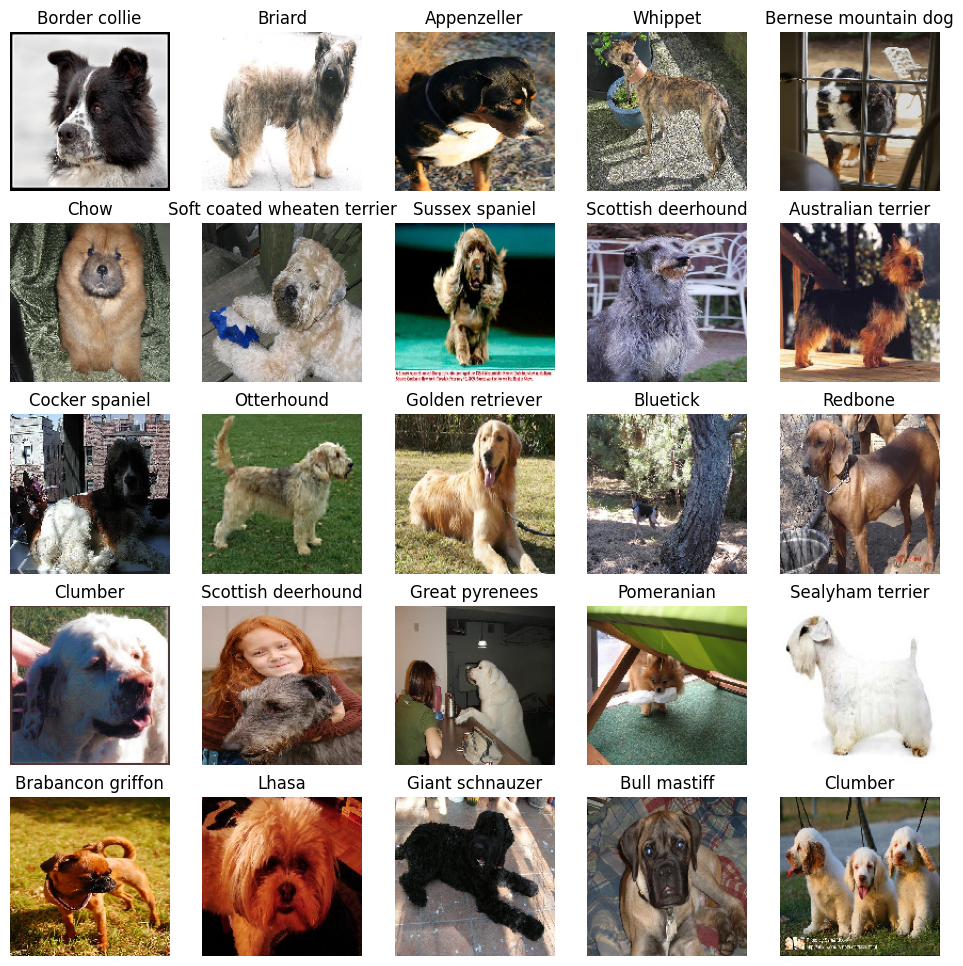

In [8]:
dims = 5
fig, axs = plt.subplots(dims,dims, figsize=(12,12))
count=0

# plot random images with labels (dog breeds) - these are random since our training data is shuffled
for x in range(dims):
    for y in range(dims):
        axs[x,y].axis("off")
        axs[x,y].imshow(np.array(X_train[count]).astype("uint8"))
        axs[x,y].set_title(categories[int(y_train[count])])
        count+=1

In [9]:
counts = np.unique(y_train, return_counts=True)[1]
num_classes = len(counts)
max_counts, min_counts = np.max(counts), np.min(counts)
sorted_counts = np.sort(counts)[::-1]

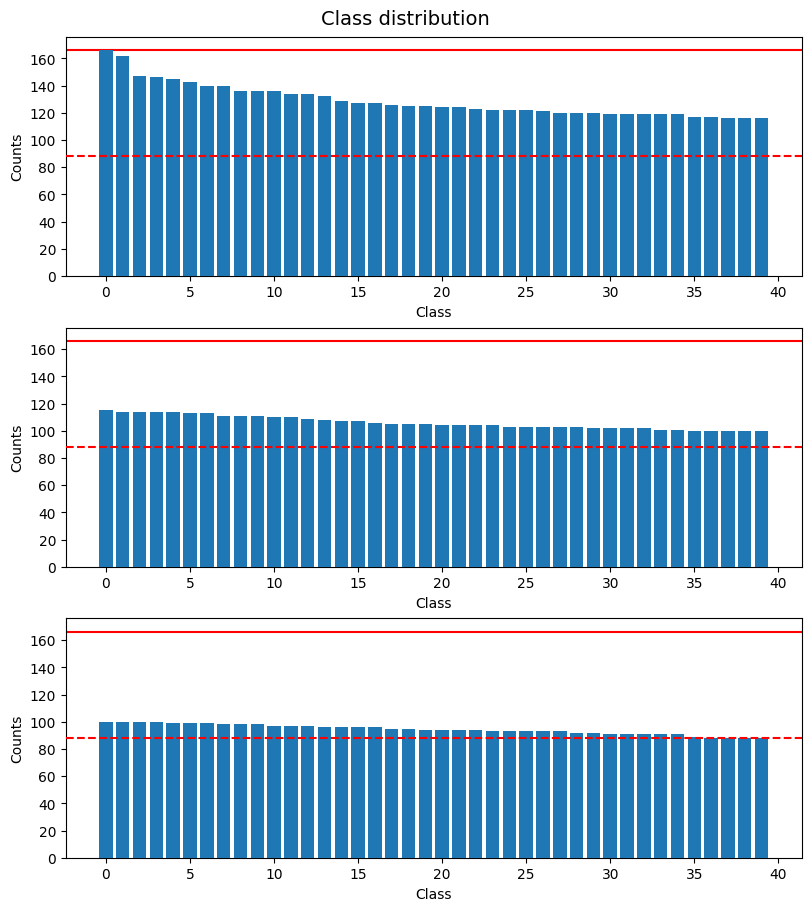

In [10]:
# bar chart showing distribution of classes
div = 40
num_plots = int(num_classes/div)
bin_sizes = np.arange(0, num_classes, div)
fig, axs = plt.subplots(num_plots,1, constrained_layout=True)
fig.set_size_inches(8, 3*num_plots)
fig.suptitle("Class distribution", fontsize=14)
plt.setp(axs, ylim=[0,max_counts+10], yticks=[0,20,40,60,80,100,120,140,160], xlabel="Class", ylabel="Counts")

for i in range(num_plots):
    div_counts = sorted_counts[bin_sizes[i]:bin_sizes[i]+div]
    axs[i].bar(range(div), div_counts, zorder=3)
    axs[i].axhline(y = max_counts, color = 'r') # max line
    axs[i].axhline(y = min_counts, color = 'r', linestyle='dashed', zorder=4) # min line

In [11]:
top_5_ind = np.argsort(counts)[-5:][::-1]
bottom_5_ind = np.argsort(counts)[:5]

print(f"Max counts: {max_counts}\nMin counts: {min_counts}\nMean counts: {np.mean(counts)}"
      f"\nKurtosis: {kurtosis(counts)}\nSkew: {skew(counts)}"
      f"\nTop 5 breeds: {np.take(categories, np.argsort(counts)[-5:][::-1])}"
      f"\nBottom 5 breeds: {np.take(categories, np.argsort(counts)[:5])}")

Max counts: 166
Min counts: 88
Mean counts: 109.75833333333334
Kurtosis: 0.7883002661831098
Skew: 1.0138674098824882
Top 5 breeds: ['Afghan hound' 'Maltese dog' 'Scottish deerhound' 'Shih tzu' 'Samoyed']
Bottom 5 breeds: ['French bulldog' 'Doberman' 'Brittany spaniel' 'Welsh springer spaniel'
 'Bouvier des flandres']


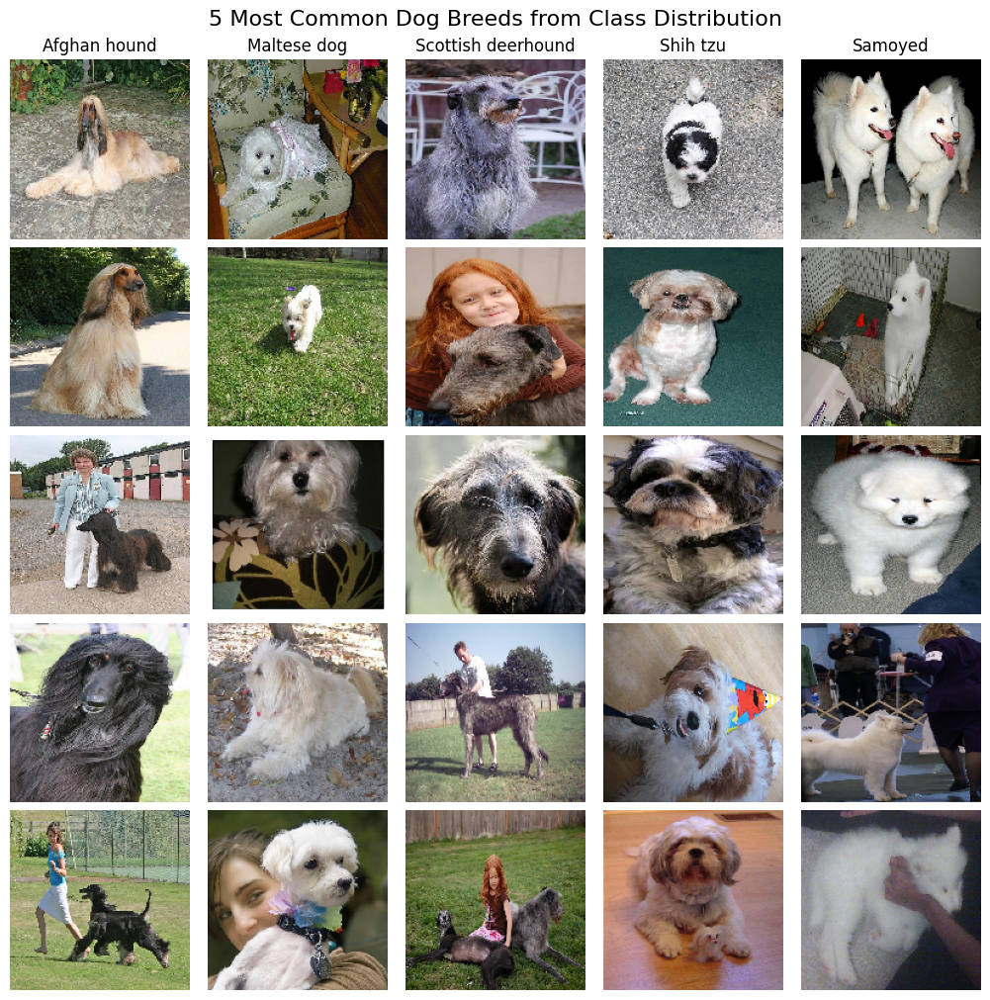

In [12]:
dims = 5
fig, axs = plt.subplots(dims,dims, figsize=(10,10), constrained_layout=True)
fig.suptitle("5 Most Common Dog Breeds from Class Distribution", fontsize=16)
count=0

# plot images of top 5 most common breeds
for x in range(dims):
    axs[0,x].set_title(categories[top_5_ind[x]])
    top_ind = np.where(y_train==top_5_ind[x])[0][:5]
    for y in range(dims):
        axs[y,x].axis("off")
        axs[y,x].imshow(np.array(X_train[top_ind[y]]).astype("uint8"))
        count+=1

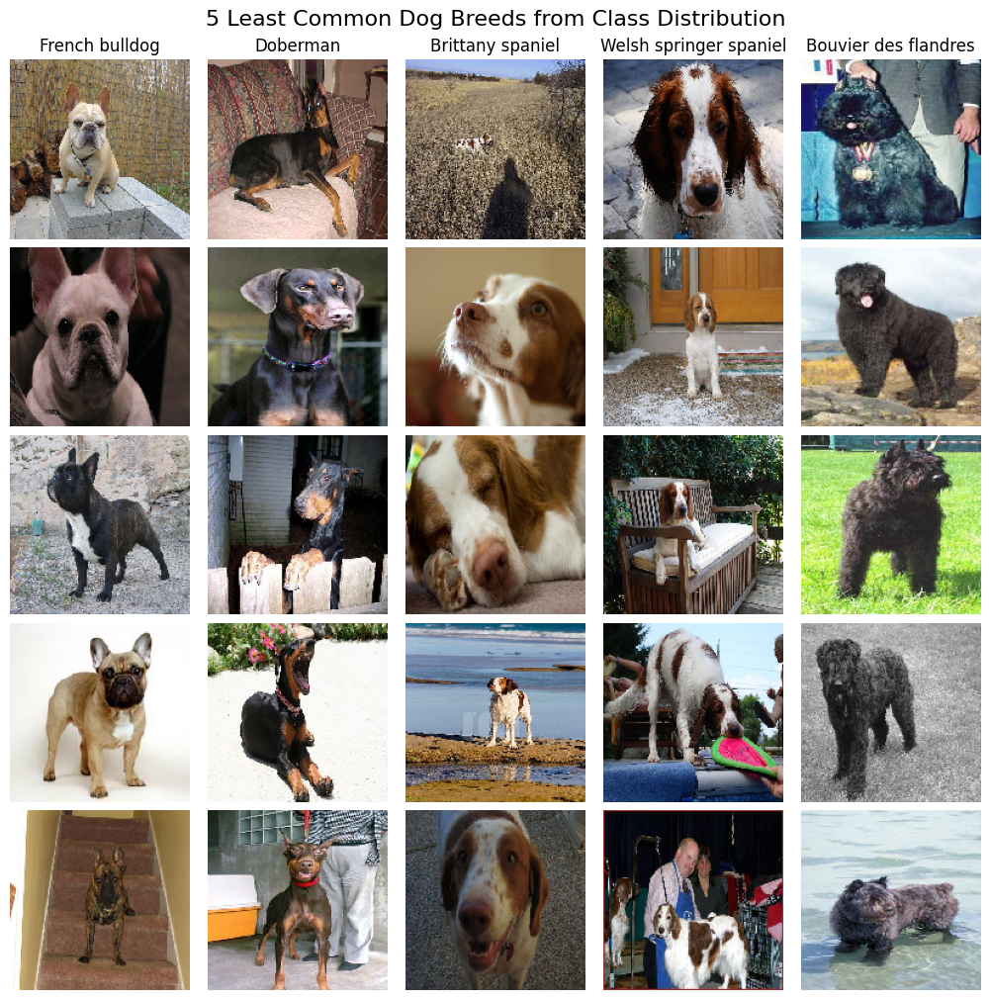

In [13]:
dims = 5
fig, axs = plt.subplots(dims,dims, figsize=(10,10), constrained_layout=True)
fig.suptitle("5 Least Common Dog Breeds from Class Distribution", fontsize=16)
count=0

# plot images of least 5 most common breeds
for x in range(dims):
    axs[0,x].set_title(categories[bottom_5_ind[x]])
    bottom_ind = np.where(y_train==bottom_5_ind[x])[0][:5]
    for y in range(dims):
        axs[y,x].axis("off")
        axs[y,x].imshow(np.array(X_train[bottom_ind[y]]).astype("uint8"))
        count+=1

In [14]:
# image augmentation 
img_augmentation_layers = [
    layers.RandomRotation(factor=0.15),
    layers.RandomTranslation(height_factor=0.1, width_factor=0.1),
    layers.RandomFlip(),
    layers.RandomContrast(factor=0.1),
]

def img_augmentation(images):
    for layer in img_augmentation_layers:
        images = layer(images)
    return images

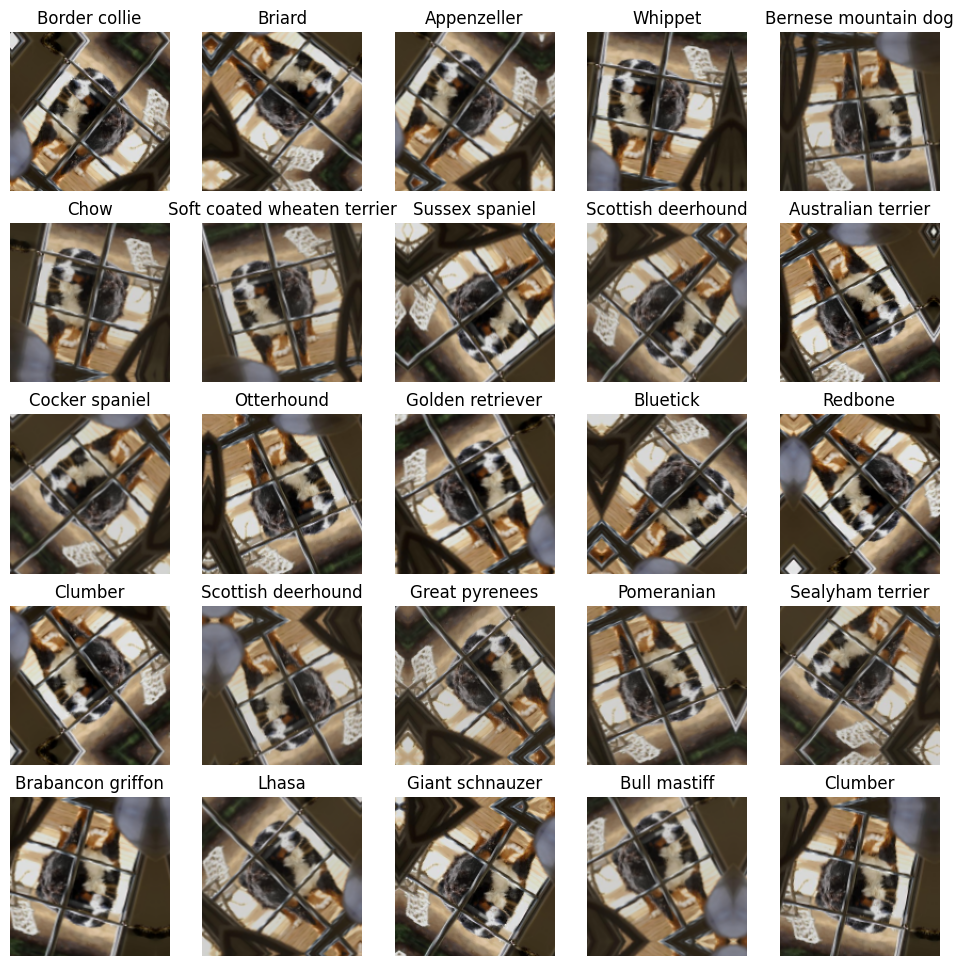

In [15]:
# images of augmented photos
dims = 5
fig, axs = plt.subplots(dims,dims, figsize=(12,12))
count=0

for x in range(dims):
    for y in range(dims):
        aug_img = np.array(img_augmentation(X_train[4]))
        axs[x,y].imshow(aug_img.astype("uint8"))
        axs[x,y].axis("off")
        axs[x,y].set_title(categories[int(y_train[count])])
        count+=1

# 4. Modeling

## 4.1 Helper functions

### Pretrained Keras Model with Transfer Learning

- **make_model** compiles a tensorflow model with pre-computed weights transfer learning
  - base_model takes any [keras application](https://keras.io/api/applications/) model as input and freezes the convolution layers and weights trained on ImageNet
  - adds a trainable pooling layer, dense layer, dropout layer and second dense layer after the base model
  - learning_rate, size_inner and droprate can be adjusted for hyperparameter tuning of these layers

In [16]:
def make_model(base_model, input_size=299, num_classes=120, learning_rate=0.01, size_inner=100, droprate=0.5):
    # use pre-trained weights for convolution layers
    base_model.trainable = False
    inputs = keras.Input(shape=(input_size, input_size, 3))
    base = base_model(inputs, training=False)

    # retrain dense layers
    vectors = keras.layers.GlobalAveragePooling2D()(base)
    inner = keras.layers.Dense(size_inner, activation='relu')(vectors) # new layer
    drop = keras.layers.Dropout(droprate)(inner) # added dropout

    # output model
    output = keras.layers.Dense(num_classes)(drop)
    model = keras.Model(inputs, output)

    # compile with optimizer and cross entropy for backprop
    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
        loss=keras.losses.CategoricalCrossentropy(from_logits=True),
        metrics=[keras.metrics.CategoricalAccuracy(), 
            tf.keras.metrics.Precision(thresholds=0),
            tf.keras.metrics.Recall(thresholds=0)]
    )
    
    return model

In [17]:
def unfreeze_model(model, learning_rate, num_layers=8):
    # We unfreeze the top 20 layers while leaving BatchNorm layers frozen
    for layer in model.layers[-num_layers:]:
        if not isinstance(layer, layers.BatchNormalization):
            layer.trainable = True

    # compile with optimizer and cross entropy for backprop
    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
        loss=keras.losses.CategoricalCrossentropy(from_logits=True),
        metrics=[keras.metrics.CategoricalAccuracy(), 
            tf.keras.metrics.Precision(thresholds=0),
            tf.keras.metrics.Recall(thresholds=0)]
    )

    return model

### Performance Evaluation Plots

- **plot_performance** creates four validation curve plots, one each for categorical accuracy, precision, recall and loss
  - Used for tuning the hyperparameters of each model
  - Different color lines for each hyperparameter with dashed lines for training data
  - Adds a legend below the four plots
- **plot_best** creates two validation curve plots including categorical accuracy and loss
  - Usdf for observing the final results of the tuned model to pick the lowest number of epochs with highest performance for efficient deployment
  - Red lines with dashed lines for training data

In [18]:
# thin lines and grid for all plots
plt.rcParams['lines.linewidth'] = 1
plt.rcParams['axes.grid'] = True

# inline plotting for notebook
%matplotlib inline

def plot_performance(scores, title, epochs, acc_lim=None, prec_lim=None, recall_lim=None, loss_lim=None):
    fig, axs = plt.subplots(2,2)#, constrained_layout=True)
    fig.set_size_inches(10,6.5)
    fig.suptitle(title, fontsize=14, y=0.925)

    # pretty colors for lines
    n = len(scores)
    colors = iter(plt.get_cmap('rainbow')(np.linspace(0, 1, n)))
    
    for lr, hist in scores.items():
        color = next(colors)
        axs[0,0].plot(hist['categorical_accuracy'], label=('train=%s' % lr), color=color, linestyle='dashed')
        axs[0,0].plot(hist['val_categorical_accuracy'], label=('val=%s' % lr), color=color)
        
        axs[1,0].plot(hist[list(hist.keys())[2]], label=('train=%s' % lr), color=color, linestyle='dashed')
        axs[1,0].plot(hist[list(hist.keys())[6]], label=('val=%s' % lr), color=color)
    
        axs[0,1].plot(hist[list(hist.keys())[3]], label=('train=%s' % lr), color=color, linestyle='dashed')
        axs[0,1].plot(hist[list(hist.keys())[7]], label=('val=%s' % lr), color=color)
    
        axs[1,1].plot(hist['loss'], label=('train=%s' % lr), color=color, linestyle='dashed')
        axs[1,1].plot(hist['val_loss'], label=('val=%s' % lr), color=color)
    
    axs[0,0].set_ylabel("Categorical Accuracy")
    axs[0,1].set_ylabel("Precision")    
    axs[1,0].set_ylabel("Recall")
    axs[1,1].set_ylabel("Loss")

    plt.setp(axs, xlim=[0,9], xlabel="Epoch", xticks=np.arange(epochs))

    if acc_lim:
        axs[0,0].set_ylim(acc_lim)
    if prec_lim:
        axs[0,1].set_ylim(prec_lim)
    if recall_lim:
        axs[1,0].set_ylim(recall_lim)
    if loss_lim:
        axs[1,1].set_ylim(loss_lim)

    # legend below plots
    axs[1,0].legend(loc='upper center', bbox_to_anchor=(1, -0.2),
              fancybox=True, shadow=True, ncol=len(scores))

In [19]:
def plot_best(hist, title):
    fig, axs = plt.subplots(1,2)
    fig.set_size_inches(8, 4)
    fig.suptitle(title, fontsize=14)

    axs[0].plot(hist['categorical_accuracy'], label="train", color='orange', linestyle='dashed')
    axs[0].plot(hist['val_categorical_accuracy'], label="val", color='navy')
    axs[0].set_xlabel("Epoch")
    axs[0].set_ylabel("Categorical Accuracy")
    
    axs[1].plot(hist['loss'], label="train", color='orange', linestyle='dashed')
    axs[1].plot(hist['val_loss'], label="val", color='navy')
    axs[1].legend()
    axs[1].set_xlabel("Epoch")
    axs[1].set_ylabel("Loss")

## 4.2 Model 1. Xception

[xception Application - Keras](https://keras.io/api/applications/xception/)

**Reference**
- [xception: Deep Learning with Depthwise Separable Convolutions](https://arxiv.org/abs/1610.02357)

**Base Model Architecture**

xception is "a deep convolutional neural network architecture inspired by Inception, where Inception modules have been replaced with depthwise separable convolutions". It outperforms Inception V3 on ImageNet while having the same number of parameters by making more efficient use of these model parameters. From figure 5 of the paper, the xception architecture: the data first goes through the entry flow, then through the middle flow which is repeated eight times, and finally through the exit flow. Note that all Convolution and SeparableConvolution layers are followed by batch normalization. All SeparableConvolution layers use a depth multiplier of 1 (no depth expansion).

<img src="../figures/xception-architecture.PNG" width="700">

In [20]:
batch_size=32
epochs=10
input_size=299
num_channels=3

# image generator for preprocessing
xception_gen = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.xception.preprocess_input)
xception_train_ds = xception_gen.flow(X_train, y_train_tf, batch_size=batch_size)
xception_val_ds = xception_gen.flow(X_val, y_val_tf, batch_size=batch_size)

In [21]:
# base model for transfer learning
xception_base_model = tf.keras.applications.xception.Xception(
    weights='imagenet',
    include_top=False,
    input_shape=(input_size, input_size, num_channels)
)

In [22]:
# print model architecture
model = make_model(xception_base_model)
model.summary(expand_nested=True)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 299, 299, 3)]     0         
                                                                 
 xception (Functional)       (None, 10, 10, 2048)      20861480  
|¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯|
| input_1 (InputLayer)      [(None, 299, 299, 3)]     0         |
|                                                               |
| block1_conv1 (Conv2D)     (None, 149, 149, 32)      864       |
|                                                               |
| block1_conv1_bn (BatchNorma  (None, 149, 149, 32)   128       |
| lization)                                                     |
|                                                               |
| block1_conv1_act (Activatio  (None, 149, 149, 32)   0         |
| n)                                                         

### Tune Learning Rate

- 1e-05, 0.01 and 0.1 underfit (low accuracy, high loss)
- 0.0001 has highest validation accuracy and lowet loss while minimizing overfitting
- 0.001 has high accuracy and low loss as well, but overfits the training data
- we want to focus on reducing both false positives and false negatives while maintaining true positives and minimizing overfitting, so we picked learning rate = 0.0001.

In [23]:
xception_lr_scores = {}

for lr in [0.00001, 0.0001, 0.001, 0.01, 0.1]:
    print(lr)
    
    model = make_model(xception_base_model, learning_rate=lr)
    history = model.fit(xception_train_ds, epochs=epochs, validation_data=xception_val_ds)#, callbacks=[csv_logger])
    xception_lr_scores[lr] = history.history

    print()
    print()

1e-05
Epoch 1/10
412/412 [==============================] - 36s 65ms/step - loss: 4.9505 - categorical_accuracy: 0.0114 - precision_1: 0.0091 - recall_1: 0.5555 - val_loss: 4.7224 - val_categorical_accuracy: 0.0179 - val_precision_1: 0.0106 - val_recall_1: 0.6447
Epoch 2/10
412/412 [==============================] - 14s 35ms/step - loss: 4.7288 - categorical_accuracy: 0.0210 - precision_1: 0.0107 - recall_1: 0.6422 - val_loss: 4.6019 - val_categorical_accuracy: 0.0416 - val_precision_1: 0.0124 - val_recall_1: 0.7376
Epoch 3/10
412/412 [==============================] - 14s 34ms/step - loss: 4.6017 - categorical_accuracy: 0.0393 - precision_1: 0.0121 - recall_1: 0.7161 - val_loss: 4.4869 - val_categorical_accuracy: 0.0823 - val_precision_1: 0.0138 - val_recall_1: 0.8026
Epoch 4/10
412/412 [==============================] - 14s 34ms/step - loss: 4.4919 - categorical_accuracy: 0.0548 - precision_1: 0.0130 - recall_1: 0.7605 - val_loss: 4.3516 - val_categorical_accuracy: 0.1376 - val_preci

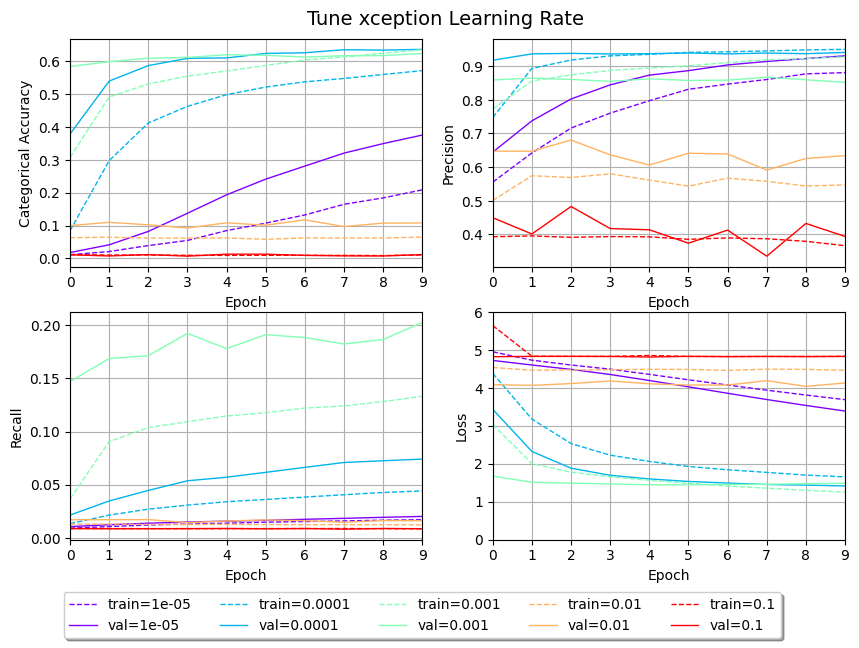

In [24]:
plot_performance(xception_lr_scores, "Tune xception Learning Rate", epochs, loss_lim=[0,6])

In [25]:
xception_learning_rate = 0.0001

### Tune inner layer

In [26]:
xception_size_scores = {}

for size in [10, 50, 100, 250, 500, 1000]:
    print(size)

    model = make_model(xception_base_model, learning_rate=xception_learning_rate, size_inner=size)
    history = model.fit(xception_train_ds, epochs=10, validation_data=xception_val_ds)
    xception_size_scores[size] = history.history

    print()
    print()

10
Epoch 1/10
412/412 [==============================] - 16s 34ms/step - loss: 4.7232 - categorical_accuracy: 0.0185 - precision_6: 0.0106 - recall_6: 0.5755 - val_loss: 4.5958 - val_categorical_accuracy: 0.0574 - val_precision_6: 0.0135 - val_recall_6: 0.6966
Epoch 2/10
412/412 [==============================] - 13s 33ms/step - loss: 4.5620 - categorical_accuracy: 0.0374 - precision_6: 0.0125 - recall_6: 0.6517 - val_loss: 4.3977 - val_categorical_accuracy: 0.1020 - val_precision_6: 0.0161 - val_recall_6: 0.7537
Epoch 3/10
412/412 [==============================] - 13s 33ms/step - loss: 4.4259 - categorical_accuracy: 0.0553 - precision_6: 0.0141 - recall_6: 0.6923 - val_loss: 4.2250 - val_categorical_accuracy: 0.1476 - val_precision_6: 0.0187 - val_recall_6: 0.7798
Epoch 4/10
412/412 [==============================] - 14s 33ms/step - loss: 4.3141 - categorical_accuracy: 0.0648 - precision_6: 0.0152 - recall_6: 0.7009 - val_loss: 4.0789 - val_categorical_accuracy: 0.1822 - val_precisio

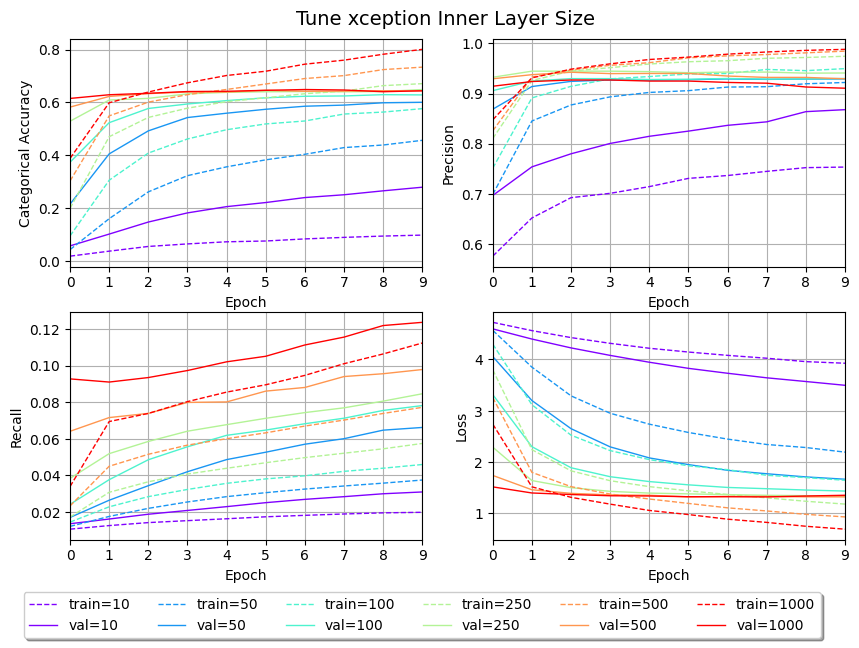

In [27]:
plot_performance(xception_size_scores, "Tune xception Inner Layer Size", epochs)

sizes 500 and 1000 have the highest performance metrics but are also subject to significant overfitting due to the increased complexity of the model. Sizes 250 and 100 fall below, while still maintaining decent performance, however 250 has slightly better performance than 100, although it is subject to a bit more overfitting. We decided to move forward with 250 as our inner layer size because this size also has the lowest loss and highest precision while minimizing overfitting (distance between train and validation curves).

In [28]:
xception_size_inner = 100

### Tune dropout rate

In [29]:
drop_scores = {}

for drop in [0.25, 0.4, 0.5, 0.6, 0.75]:
    print(drop)

    model = make_model(xception_base_model, learning_rate=xception_learning_rate, size_inner=xception_size_inner, droprate=drop)
    history = model.fit(xception_train_ds, epochs=10, validation_data=xception_val_ds)
    drop_scores[drop] = history.history

    print()
    print()

0.25
Epoch 1/10
412/412 [==============================] - 18s 40ms/step - loss: 3.9317 - categorical_accuracy: 0.1809 - precision_12: 0.0164 - recall_12: 0.8138 - val_loss: 2.7414 - val_categorical_accuracy: 0.4412 - val_precision_12: 0.0276 - val_recall_12: 0.9332
Epoch 2/10
412/412 [==============================] - 14s 35ms/step - loss: 2.4188 - categorical_accuracy: 0.4512 - precision_12: 0.0279 - recall_12: 0.9313 - val_loss: 1.8624 - val_categorical_accuracy: 0.5715 - val_precision_12: 0.0404 - val_recall_12: 0.9435
Epoch 3/10
412/412 [==============================] - 14s 35ms/step - loss: 1.9204 - categorical_accuracy: 0.5317 - precision_12: 0.0337 - recall_12: 0.9453 - val_loss: 1.6295 - val_categorical_accuracy: 0.6058 - val_precision_12: 0.0451 - val_recall_12: 0.9484
Epoch 4/10
412/412 [==============================] - 14s 35ms/step - loss: 1.6990 - categorical_accuracy: 0.5654 - precision_12: 0.0372 - recall_12: 0.9554 - val_loss: 1.5268 - val_categorical_accuracy: 0.617

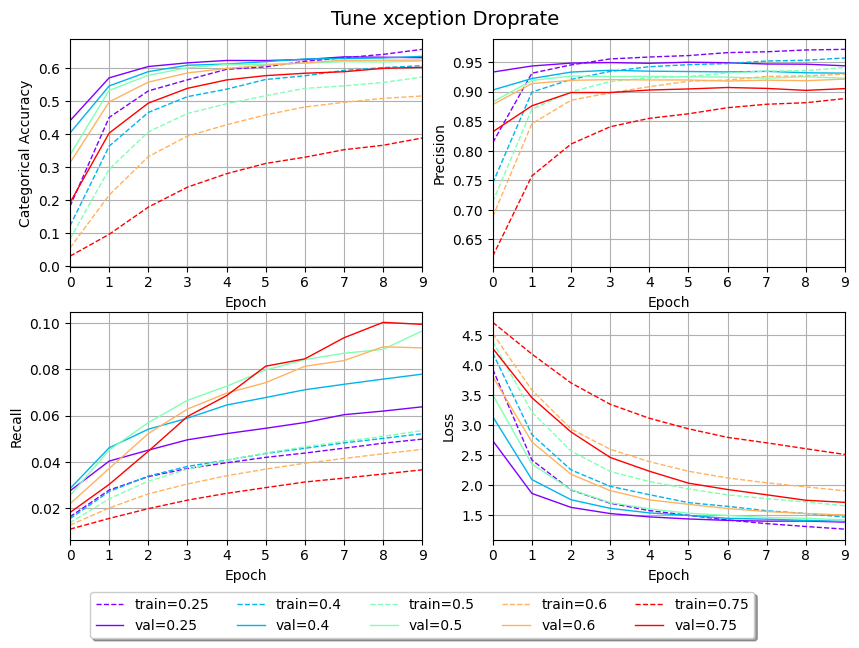

In [30]:
plot_performance(drop_scores, "Tune xception Droprate", 10)

In [31]:
xception_droprate = 0.4

### Save best model

In [32]:
# image generator for epoch tuning and final learning curve analysis
xception_train_ds_big = xception_gen.flow(X_train_big, y_train_big_tf, batch_size=batch_size)
xception_val_ds_big = xception_gen.flow(X_val_big, y_val_big_tf, batch_size=batch_size)

In [33]:
# create model with begininng layers trainable
model = make_model(xception_base_model, learning_rate=xception_learning_rate, size_inner=xception_size_inner, droprate=xception_droprate)
model = unfreeze_model(model, learning_rate=xception_learning_rate, num_layers=4)

# fit model to training data
xception_train_history = model.fit(
    xception_train_ds_big,
    epochs=20,
    validation_data=xception_val_ds_big
)

Epoch 1/20
412/412 [==============================] - 58s 136ms/step - loss: 4.0784 - categorical_accuracy: 0.2470 - precision_18: 0.0203 - recall_18: 0.8349 - val_loss: 3.0841 - val_categorical_accuracy: 0.7027 - val_precision_18: 0.0534 - val_recall_18: 0.9745
Epoch 2/20
412/412 [==============================] - 50s 121ms/step - loss: 2.4803 - categorical_accuracy: 0.6034 - precision_18: 0.0452 - recall_18: 0.9645 - val_loss: 1.6084 - val_categorical_accuracy: 0.8245 - val_precision_18: 0.1141 - val_recall_18: 0.9885
Epoch 3/20
412/412 [==============================] - 50s 121ms/step - loss: 1.5313 - categorical_accuracy: 0.7270 - precision_18: 0.0652 - recall_18: 0.9787 - val_loss: 0.9341 - val_categorical_accuracy: 0.8597 - val_precision_18: 0.1356 - val_recall_18: 0.9909
Epoch 4/20
412/412 [==============================] - 50s 121ms/step - loss: 1.1042 - categorical_accuracy: 0.7718 - precision_18: 0.0765 - recall_18: 0.9854 - val_loss: 0.6626 - val_categorical_accuracy: 0.8722

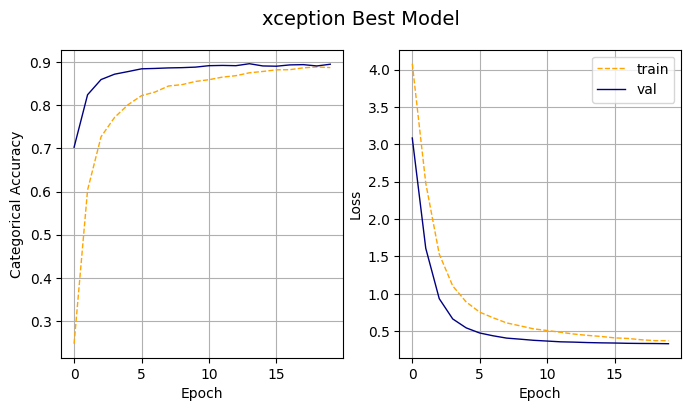

In [34]:
# final learning curves
plot_best(xception_train_history.history, title="xception Best Model")

In [35]:
# performance metrics for model comparison
xception_params = model.count_params()
xception_epochs = np.argmax(xception_train_history.history['val_categorical_accuracy'])
xception_train_accuracy = xception_train_history.history['categorical_accuracy'][xception_epochs]
xception_train_loss = xception_train_history.history['loss'][xception_epochs]
xception_val_accuracy = xception_train_history.history['val_categorical_accuracy'][xception_epochs]
xception_val_loss = xception_train_history.history['val_loss'][xception_epochs]

**Retrain model at tuned number of epochs to save**

In [36]:
# create new model
model = make_model(xception_base_model, learning_rate=xception_learning_rate, size_inner=xception_size_inner, droprate=xception_droprate)
model = unfreeze_model(model, learning_rate=xception_learning_rate, num_layers=4)

# fit model to training data with tuned num of epochs to prevent overfitting
start = time()
model.fit(
    xception_train_ds_big,
    epochs=xception_epochs
)
xception_train_time = time() - start
xception_train_time = xception_train_time/epochs

Epoch 1/13
412/412 [==============================] - 133s 319ms/step - loss: 4.0653 - categorical_accuracy: 0.2458 - precision_20: 0.0197 - recall_20: 0.8403
Epoch 2/13
412/412 [==============================] - 53s 129ms/step - loss: 2.4362 - categorical_accuracy: 0.6177 - precision_20: 0.0457 - recall_20: 0.9611
Epoch 3/13
412/412 [==============================] - 51s 123ms/step - loss: 1.5165 - categorical_accuracy: 0.7236 - precision_20: 0.0653 - recall_20: 0.9796
Epoch 4/13
412/412 [==============================] - 50s 122ms/step - loss: 1.0877 - categorical_accuracy: 0.7723 - precision_20: 0.0770 - recall_20: 0.9857
Epoch 5/13
412/412 [==============================] - 50s 122ms/step - loss: 0.8786 - categorical_accuracy: 0.8012 - precision_20: 0.0844 - recall_20: 0.9863
Epoch 6/13
412/412 [==============================] - 50s 122ms/step - loss: 0.7523 - categorical_accuracy: 0.8224 - precision_20: 0.0897 - recall_20: 0.9874
Epoch 7/13
412/412 [==============================]

In [47]:
# save model
path = os.path.join('..', 'models', 'xception_model.keras')
model.save(path)

# model size in mb
xception_size = os.stat(path).st_size / (1024 * 1024)

### Final prediction

In [48]:
# load model
path = os.path.join('..', 'models', 'xception_model.keras')
xception_model = keras.models.load_model(path)

In [49]:
# image generator with held-out training data for test data prediction
xception_test_ds_big = xception_gen.flow(X_test_big, y_test_big_tf, batch_size=batch_size,shuffle=False)

# compute testing statistics
start = time()
xception_test_predict = xception_model.predict(xception_test_ds_big)
xception_predict_time = time() - start

xception_test_predict = np.argmax(xception_test_predict, axis=1)
xception_accuracy, xception_precision, xception_recall, xception_f1 = accuracy_score(xception_test_predict, y_test_big), precision_score(xception_test_predict, y_test_big, average='macro'), recall_score(xception_test_predict, y_test_big, average='macro'), f1_score(xception_test_predict, y_test_big, average='macro')

129/129 [==============================] - 13s 94ms/step


In [50]:
new_line = "\n"
print(
    f"--- Xception Final Info and Statistics ---{new_line}"
    f"-- Tuned parameters --{new_line}"
    f"learning rate: {xception_learning_rate}{new_line}"
    f"inner layer size: {xception_size_inner}{new_line}"
    f"dropout rate: {xception_droprate}{new_line}"
    f"epochs: {xception_epochs}{new_line}{new_line}"

    f"-- Model info --{new_line}"
    f"model size: {xception_size:,.3f}{new_line}"
    f"number of parameters: {xception_params}{new_line}{new_line}"

    f"-- Model statistics --{new_line}"
    f"avg train time: {xception_train_time:,.3f}{new_line}"
    f"predict time: {xception_predict_time:,.3f}{new_line}{new_line}"

    f"training accuracy: {xception_train_accuracy:,.3f}{new_line}"
    f"training loss: {xception_train_loss:,.3f}{new_line}{new_line}"
 
    f"validation accuracy: {xception_val_accuracy:,.3f}{new_line}"
    f"validation loss: {xception_val_loss:,.3f}{new_line}{new_line}"
 
    f"test accuracy: {xception_accuracy:,.3f}{new_line}"
    f"test precision: {xception_precision:,.3f}{new_line}"
    f"test recall: {xception_recall:,.3f}{new_line}"
    f"test f1: {xception_f1:,.3f}{new_line}"
)

--- Xception Final Info and Statistics ---
-- Tuned parameters --
learning rate: 0.0001
inner layer size: 100
dropout rate: 0.4
epochs: 13

-- Model info --
model size: 82.333
number of parameters: 21078500

-- Model statistics --
avg train time: 70.203
predict time: 12.696

training accuracy: 0.875
training loss: 0.442

validation accuracy: 0.896
validation loss: 0.346

test accuracy: 0.901
test precision: 0.898
test recall: 0.900
test f1: 0.897



In [51]:
new_line = "\n"
print(
    f"xception_learning_rate = {xception_learning_rate}{new_line}"
    f"xception_size_inner = {xception_size_inner}{new_line}"
    f"xception_droprate = {xception_droprate}{new_line}"
    f"xception_epochs = {xception_epochs}{new_line}{new_line}"

    f"xception_size = {xception_size}{new_line}"
    f"xception_params = {xception_params}{new_line}{new_line}"

    f"xception_train_time = {xception_train_time}{new_line}"
    f"xception_predict_time = {xception_predict_time}{new_line}{new_line}"

    f"xception_train_accuracy = {xception_train_accuracy}{new_line}"
    f"xception_train_loss = {xception_train_loss}{new_line}{new_line}"

    f"xception_val_accuracy = {xception_val_accuracy}{new_line}"
    f"xception_val_loss = {xception_val_loss}{new_line}{new_line}"
 
    f"xception_accuracy = {xception_accuracy}{new_line}"
    f"xception_precision = {xception_precision}{new_line}"
    f"xception_recall = {xception_recall}{new_line}"
    f"xception_f1 = {xception_f1}{new_line}"
)

xception_learning_rate = 0.0001
xception_size_inner = 100
xception_droprate = 0.4
xception_epochs = 13

xception_size = 82.33295440673828
xception_params = 21078500

xception_train_time = 70.20254971981049
xception_predict_time = 12.695999383926392

xception_train_accuracy = 0.8754081130027771
xception_train_loss = 0.44249117374420166

xception_val_accuracy = 0.8964470028877258
xception_val_loss = 0.34642693400382996

xception_accuracy = 0.9006316812439261
xception_precision = 0.8981460711917685
xception_recall = 0.8997388394335715
xception_f1 = 0.8966811266039125



## 4.3 Model 2. InceptionResNetV2

[InceptionResNetV2 Application - Keras](https://keras.io/api/applications/inceptionresnetv2/)

**Reference**
- [Inception-v4, Inception-ResNet and the Impact of Residual Connections on Learning](https://arxiv.org/abs/1602.07261) (AAAI 2017)

**Base Model Architecture**

Figures 3-9 from [Inception-v4, Inception-ResNet and the Impact of Residual Connections on Learning](https://arxiv.org/abs/1602.07261) (AAAI 2017). Figure 3 shows the architecture divided into blocks. The full architecture next to it is taken from figures 4-9. Note that each inception block is repeated the number of times as specified in figure 3, and also next to the Filter concat block. For Reduction-B, the k, l, m, n numbers represent filter bank sizes which can be looked up in Table 1.

<img src="../figures/resnetv2-architecture.PNG" width="1000">

In [52]:
# image generator for preprocessing
inception_gen = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.inception_resnet_v2.preprocess_input)
inception_train_ds = inception_gen.flow(X_train, y_train_tf, batch_size=batch_size)
inception_val_ds = inception_gen.flow(X_val, y_val_tf, batch_size=batch_size)

In [53]:
inception_base_model = tf.keras.applications.inception_resnet_v2.InceptionResNetV2(
        weights='imagenet',
        include_top=False,
        input_shape=(299, 299, 3)
    )

epochs = 20

In [54]:
model = make_model(inception_base_model)
model.summary(expand_nested=True)

Model: "model_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_22 (InputLayer)       [(None, 299, 299, 3)]     0         
                                                                 
 inception_resnet_v2 (Functi  (None, 8, 8, 1536)       54336736  
 onal)                                                           
|¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯|
| input_21 (InputLayer)     [(None, 299, 299, 3)]     0         |
|                                                               |
| conv2d_4 (Conv2D)         (None, 149, 149, 32)      864       |
|                                                               |
| batch_normalization_4 (Batc  (None, 149, 149, 32)   96        |
| hNormalization)                                               |
|                                                               |
| activation (Activation)   (None, 149, 149, 32)      0   

### Tune learning rate

In [77]:
inception_lr_scores = {}

for lr in [0.00001, 0.0001, 0.001, 0.01, 0.1]:
    print(lr)

    model = make_model(inception_base_model, learning_rate=lr)
    history = model.fit(inception_train_ds, epochs=epochs, validation_data=inception_val_ds)
    inception_lr_scores[lr] = history.history

    print()
    print()

1e-05
Epoch 1/20
412/412 [==============================] - 43s 86ms/step - loss: 5.8597 - categorical_accuracy: 0.0102 - precision_46: 0.0088 - recall_46: 0.5259 - val_loss: 4.7978 - val_categorical_accuracy: 0.0249 - val_precision_46: 0.0102 - val_recall_46: 0.6025
Epoch 2/20
412/412 [==============================] - 33s 79ms/step - loss: 4.7913 - categorical_accuracy: 0.0248 - precision_46: 0.0106 - recall_46: 0.6319 - val_loss: 4.5252 - val_categorical_accuracy: 0.0653 - val_precision_46: 0.0125 - val_recall_46: 0.7379
Epoch 3/20
412/412 [==============================] - 33s 80ms/step - loss: 4.5531 - categorical_accuracy: 0.0437 - precision_46: 0.0122 - recall_46: 0.7226 - val_loss: 4.3317 - val_categorical_accuracy: 0.1269 - val_precision_46: 0.0138 - val_recall_46: 0.8084
Epoch 4/20
412/412 [==============================] - 33s 79ms/step - loss: 4.3839 - categorical_accuracy: 0.0713 - precision_46: 0.0131 - recall_46: 0.7700 - val_loss: 4.1231 - val_categorical_accuracy: 0.19

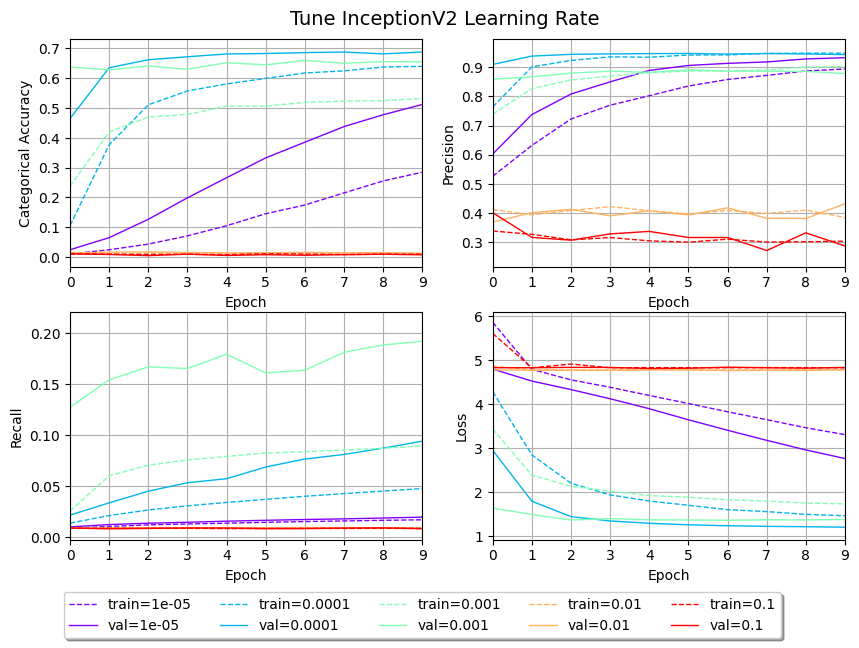

In [170]:
plot_performance(inception_lr_scores, "Tune InceptionV2 Learning Rate", epochs)

In [231]:
inception_learning_rate = 0.0001

### Tune inner layer

In [80]:
inception_size_scores = {}

for size in [10, 50, 100, 250, 500, 1000]:
    print(size)

    model = make_model(inception_base_model, learning_rate=inception_learning_rate, size_inner=size)
    history = model.fit(inception_train_ds, epochs=epochs, validation_data=inception_val_ds)
    inception_size_scores[size] = history.history

    print()
    print()

10
Epoch 1/20
412/412 [==============================] - 41s 83ms/step - loss: 4.7387 - categorical_accuracy: 0.0191 - precision_51: 0.0101 - recall_51: 0.5252 - val_loss: 4.5593 - val_categorical_accuracy: 0.0501 - val_precision_51: 0.0134 - val_recall_51: 0.6814
Epoch 2/20
412/412 [==============================] - 32s 78ms/step - loss: 4.5112 - categorical_accuracy: 0.0408 - precision_51: 0.0127 - recall_51: 0.6469 - val_loss: 4.2314 - val_categorical_accuracy: 0.1172 - val_precision_51: 0.0175 - val_recall_51: 0.7829
Epoch 3/20
412/412 [==============================] - 32s 78ms/step - loss: 4.2989 - categorical_accuracy: 0.0620 - precision_51: 0.0148 - recall_51: 0.7021 - val_loss: 3.9640 - val_categorical_accuracy: 0.1919 - val_precision_51: 0.0204 - val_recall_51: 0.8220
Epoch 4/20
412/412 [==============================] - 32s 78ms/step - loss: 4.1440 - categorical_accuracy: 0.0773 - precision_51: 0.0164 - recall_51: 0.7296 - val_loss: 3.7551 - val_categorical_accuracy: 0.2314 

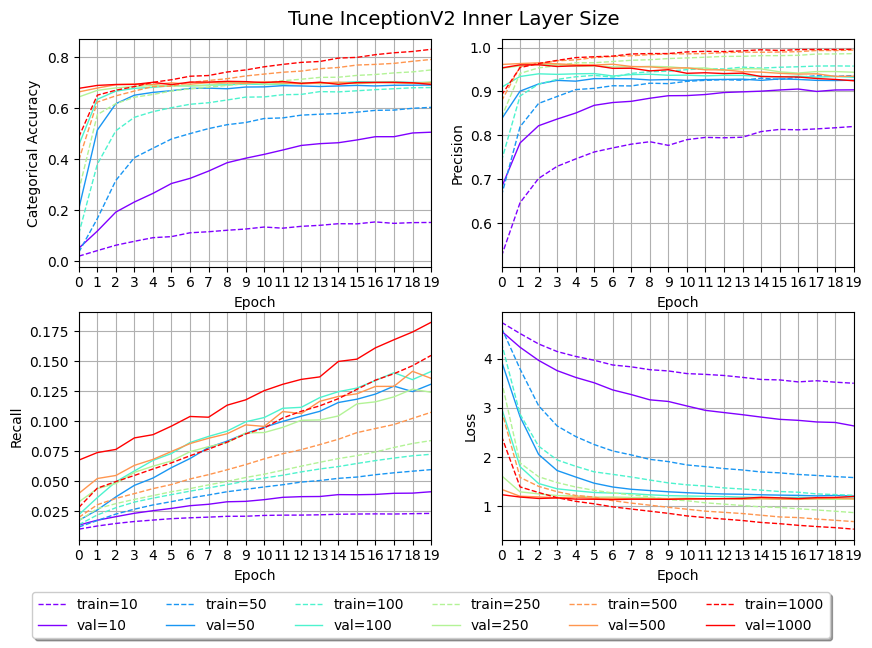

In [81]:
plot_performance(inception_size_scores, "Tune InceptionV2 Inner Layer Size", epochs)

In [232]:
inception_size_inner = 100

### Tune dropout rate

In [83]:
inception_drop_scores = {}

for drop in [0.25, 0.4, 0.5, 0.6, 0.75]:
    print(drop)

    model = make_model(base_model=inception_base_model,learning_rate=inception_learning_rate, size_inner=inception_size_inner, droprate=drop)
    history = model.fit(inception_train_ds, epochs=10, validation_data=inception_val_ds)
    inception_drop_scores[drop] = history.history

    print()
    print()

0.25
Epoch 1/10
412/412 [==============================] - 41s 84ms/step - loss: 3.7486 - categorical_accuracy: 0.2254 - precision_57: 0.0163 - recall_57: 0.8203 - val_loss: 2.0502 - val_categorical_accuracy: 0.5797 - val_precision_57: 0.0268 - val_recall_57: 0.9371
Epoch 2/10
412/412 [==============================] - 32s 78ms/step - loss: 1.9416 - categorical_accuracy: 0.5682 - precision_57: 0.0279 - recall_57: 0.9378 - val_loss: 1.4301 - val_categorical_accuracy: 0.6529 - val_precision_57: 0.0376 - val_recall_57: 0.9490
Epoch 3/10
412/412 [==============================] - 32s 78ms/step - loss: 1.5924 - categorical_accuracy: 0.6191 - precision_57: 0.0332 - recall_57: 0.9487 - val_loss: 1.3235 - val_categorical_accuracy: 0.6678 - val_precision_57: 0.0420 - val_recall_57: 0.9508
Epoch 4/10
412/412 [==============================] - 32s 78ms/step - loss: 1.4517 - categorical_accuracy: 0.6419 - precision_57: 0.0366 - recall_57: 0.9582 - val_loss: 1.2739 - val_categorical_accuracy: 0.672

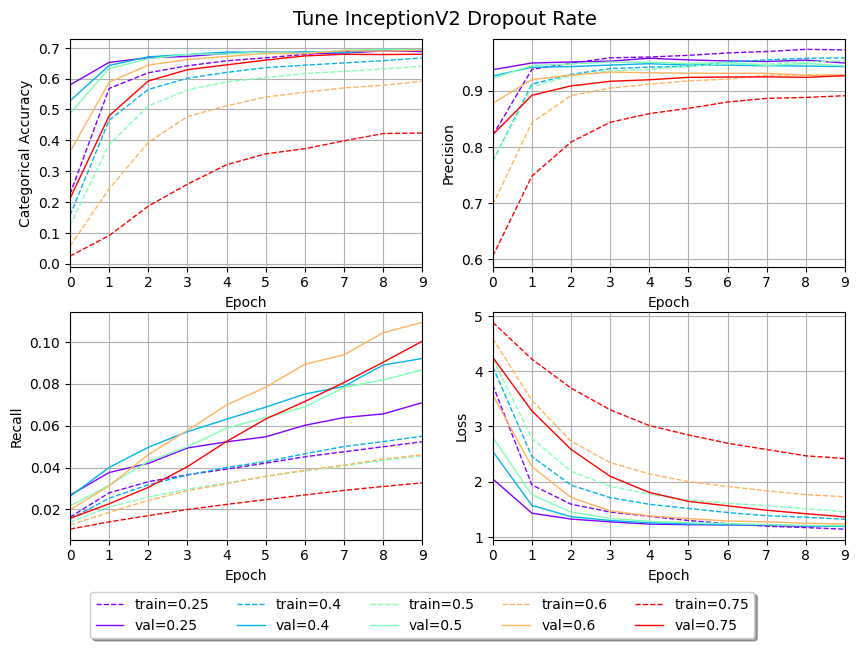

In [84]:
plot_performance(inception_drop_scores, "Tune InceptionV2 Dropout Rate", 10)

In [233]:
inception_droprate = 0.4

### Save best model

In [269]:
# image generator for final testing
inception_train_ds_big = inception_gen.flow(X_train_big, y_train_big_tf, batch_size=batch_size)
inception_val_ds_big = inception_gen.flow(X_val_big, y_val_big_tf, batch_size=batch_size)

In [270]:
# create model with begininng layers trainable
model = make_model(inception_base_model, learning_rate=inception_learning_rate, size_inner=inception_size_inner, droprate=inception_droprate)
model = unfreeze_model(model, learning_rate=inception_learning_rate, num_layers=4)

# fit model to training data
inception_train_history = model.fit(
    inception_train_ds_big,
    epochs=20,
    validation_data=inception_val_ds_big
)

Epoch 1/20
412/412 [==============================] - 99s 221ms/step - loss: 3.8489 - categorical_accuracy: 0.3190 - precision_42: 0.0203 - recall_42: 0.8724 - val_loss: 2.5377 - val_categorical_accuracy: 0.8090 - val_precision_42: 0.0628 - val_recall_42: 0.9882
Epoch 2/20
412/412 [==============================] - 88s 214ms/step - loss: 1.8622 - categorical_accuracy: 0.7522 - precision_42: 0.0544 - recall_42: 0.9791 - val_loss: 0.9440 - val_categorical_accuracy: 0.8940 - val_precision_42: 0.1744 - val_recall_42: 0.9875
Epoch 3/20
412/412 [==============================] - 88s 215ms/step - loss: 1.0083 - categorical_accuracy: 0.8341 - precision_42: 0.0815 - recall_42: 0.9828 - val_loss: 0.5126 - val_categorical_accuracy: 0.9059 - val_precision_42: 0.2043 - val_recall_42: 0.9875
Epoch 4/20
412/412 [==============================] - 89s 215ms/step - loss: 0.7052 - categorical_accuracy: 0.8616 - precision_42: 0.0956 - recall_42: 0.9854 - val_loss: 0.3815 - val_categorical_accuracy: 0.9092

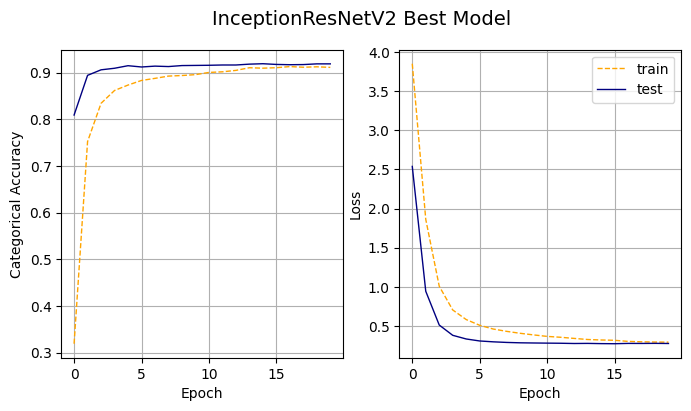

In [271]:
plot_best(inception_train_history.history, title="InceptionResNetV2 Best Model")

In [303]:
# performance metrics for model comparison
inception_params = model.count_params()
inception_epochs = np.argmax(inception_train_history.history['val_categorical_accuracy'])
inception_train_accuracy = inception_train_history.history['categorical_accuracy'][inception_epochs]
inception_train_loss = inception_train_history.history['loss'][inception_epochs]
inception_val_accuracy = inception_train_history.history['val_categorical_accuracy'][inception_epochs]
inception_val_loss = inception_train_history.history['val_loss'][inception_epochs]

**Retrain model at tuned number of epochs to save**

In [275]:
# create new model
model = make_model(inception_base_model, learning_rate=inception_learning_rate, size_inner=inception_size_inner, droprate=inception_droprate)
model = unfreeze_model(model, learning_rate=inception_learning_rate, num_layers=4)

# fit model to training data with tuned num of epochs to prevent overfitting
start = time()
model.fit(
    inception_train_ds_big,
    epochs=inception_epochs
)
inception_train_time = time() - start
inception_train_time = inception_train_time/epochs

Epoch 1/14
412/412 [==============================] - 78s 172ms/step - loss: 3.7561 - categorical_accuracy: 0.3319 - precision_44: 0.0204 - recall_44: 0.8906
Epoch 2/14
412/412 [==============================] - 71s 173ms/step - loss: 1.7814 - categorical_accuracy: 0.7616 - precision_44: 0.0497 - recall_44: 0.9832
Epoch 3/14
412/412 [==============================] - 71s 173ms/step - loss: 0.9699 - categorical_accuracy: 0.8399 - precision_44: 0.0697 - recall_44: 0.9872
Epoch 4/14
412/412 [==============================] - 71s 173ms/step - loss: 0.6944 - categorical_accuracy: 0.8608 - precision_44: 0.0804 - recall_44: 0.9898
Epoch 5/14
412/412 [==============================] - 72s 173ms/step - loss: 0.5826 - categorical_accuracy: 0.8728 - precision_44: 0.0862 - recall_44: 0.9904
Epoch 6/14
412/412 [==============================] - 71s 173ms/step - loss: 0.5023 - categorical_accuracy: 0.8826 - precision_44: 0.0911 - recall_44: 0.9924
Epoch 7/14
412/412 [==============================] 

In [276]:
# save model
path = os.path.join('..', 'models', 'inception_model.keras')
model.save(path)

# model size in mb
inception_size = os.stat(path).st_size / (1024 * 1024)

### Final prediction

In [56]:
# load model
path = os.path.join('..', 'models', 'inception_model.keras')
inception_model = keras.models.load_model(path)

In [58]:
# image generator with held-out training data for test data prediction
inception_test_ds_big = inception_gen.flow(X_test_big, y_test_big_tf, batch_size=batch_size,shuffle=False)

# compute testing statistics
start = time()
inception_test_predict = inception_model.predict(inception_test_ds_big)
inception_predict_time = time() - start

inception_test_predict = np.argmax(inception_test_predict, axis=1)
inception_accuracy, inception_precision, inception_recall, inception_f1 = accuracy_score(inception_test_predict, y_test_big), precision_score(inception_test_predict, y_test_big, average='macro'), recall_score(inception_test_predict, y_test_big, average='macro'), f1_score(inception_test_predict, y_test_big, average='macro')

129/129 [==============================] - 24s 168ms/step


In [59]:
new_line = "\n"
print(
    f"--- Inception Final Info and Statistics ---{new_line}"
    f"-- Tuned parameters --{new_line}"
    f"learning rate: {inception_learning_rate}{new_line}"
    f"inner layer size: {inception_size_inner}{new_line}"
    f"dropout rate: {inception_droprate}{new_line}"
    f"epochs: {inception_epochs+1}{new_line}{new_line}"

    f"-- Model info --{new_line}"
    f"model size: {inception_size:,.3f}{new_line}"
    f"number of parameters: {inception_params}{new_line}{new_line}"

    f"-- Model statistics --{new_line}"
    f"avg train time: {inception_train_time:,.3f}{new_line}"
    f"predict time: {inception_predict_time:,.3f}{new_line}{new_line}"

    f"training accuracy: {inception_train_accuracy:,.3f}{new_line}"
    f"training loss: {inception_train_loss:,.3f}{new_line}{new_line}"
 
    f"validation accuracy: {inception_val_accuracy:,.3f}{new_line}"
    f"validation loss: {inception_val_loss:,.3f}{new_line}{new_line}"
 
    f"test accuracy: {inception_accuracy:,.3f}{new_line}"
    f"test precision: {inception_precision:,.3f}{new_line}"
    f"test recall: {inception_recall:,.3f}{new_line}"
    f"test f1: {inception_f1:,.3f}{new_line}"
)

--- Inception Final Info and Statistics ---
-- Tuned parameters --
learning rate: 0.0001
inner layer size: 100
dropout rate: 0.4
epochs: 15

-- Model info --
model size: 210.371
number of parameters: 11197905

-- Model statistics --
avg train time: 100.762
predict time: 24.258

training accuracy: 0.909
training loss: 0.322

validation accuracy: 0.919
validation loss: 0.275

test accuracy: 0.920
test precision: 0.917
test recall: 0.921
test f1: 0.916



In [60]:
new_line = "\n"
print(
    f"inception_learning_rate = {inception_learning_rate}{new_line}"
    f"inception_size_inner = {inception_size_inner}{new_line}"
    f"inception_droprate = {inception_droprate}{new_line}"
    f"inception_epochs = {inception_epochs}{new_line}{new_line}"

    f"inception_size = {inception_size}{new_line}"
    f"inception_params = {inception_params}{new_line}{new_line}"

    f"inception_train_time = {inception_train_time}{new_line}"
    f"inception_predict_time = {inception_predict_time}{new_line}{new_line}"

    f"inception_train_accuracy = {inception_train_accuracy}{new_line}"
    f"inception_train_loss = {inception_train_loss}{new_line}{new_line}"

    f"inception_val_accuracy = {inception_val_accuracy}{new_line}"
    f"inception_val_loss = {inception_val_loss}{new_line}{new_line}"
 
    f"inception_accuracy = {inception_accuracy}{new_line}"
    f"inception_precision = {inception_precision}{new_line}"
    f"inception_recall = {inception_recall}{new_line}"
    f"inception_f1 = {inception_f1}{new_line}"
)

inception_learning_rate = 0.0001
inception_size_inner = 100
inception_droprate = 0.4
inception_epochs = 14

inception_size = 210.3712158203125
inception_params = 11197905

inception_train_time = 100.76209533214569
inception_predict_time = 24.257522583007812

inception_train_accuracy = 0.9093462824821472
inception_train_loss = 0.3218846321105957

inception_val_accuracy = 0.9189189076423645
inception_val_loss = 0.27544060349464417

inception_accuracy = 0.9195821185617103
inception_precision = 0.916935122528641
inception_recall = 0.9206344583123024
inception_f1 = 0.9161799918479486



## 4.4 Model 3. EfficientNetB3V2

[EfficientNetB3 Application - Keras](https://keras.io/api/applications/efficientnet/#efficientnetb3-function)

[Efficientnet Fine Tuning - Keras](https://keras.io/examples/vision/image_classification_efficientnet_fine_tuning/)

**Reference**
- [EfficientNet: Rethinking Model Scaling for Convolutional Neural Networks](https://arxiv.org/abs/1905.11946) (ICML 2019)

**Base Model Architecture**

The EfficientNet baseline architecture leverages a multi-objective neural architecture search that optimizes both accuracy and FLOPS. EfficientNetB0 is shown in Table 1 below from the paper, using MBConv layers from ([Sandler et al., 2018](https://arxiv.org/abs/1801.04381); [Tan et al., 2019](https://arxiv.org/abs/1807.11626)). EfficientNetB3 is a scaled-up version, using uniform dimension scaling as shown in (e) from the figure 2 below.

<img src="../figures/efficientnetb3-table.PNG" width="350">
<img src="../figures/efficientnetb3-scaling.PNG" width="700">

In [61]:
effnetB3_base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B3(
        weights='imagenet',
        include_top=False,
        input_shape=(299, 299, 3)
    )
epochs=10
batch_size=32

In [62]:
# image generator for preprocessing
effnetB3_gen = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.efficientnet_v2.preprocess_input)
effnetB3_train_ds = effnetB3_gen.flow(X_train, y_train_tf, batch_size=batch_size)
effnetB3_val_ds = effnetB3_gen.flow(X_val, y_val_tf, batch_size=batch_size)

In [63]:
model = make_model(effnetB3_base_model)
model.summary(expand_nested=True)

Model: "model_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_24 (InputLayer)       [(None, 299, 299, 3)]     0         
                                                                 
 efficientnetv2-b3 (Function  (None, 10, 10, 1536)     12930622  
 al)                                                             
|¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯|
| input_23 (InputLayer)     [(None, 299, 299, 3)]     0         |
|                                                               |
| rescaling (Rescaling)     (None, 299, 299, 3)       0         |
|                                                               |
| normalization (Normalizatio  (None, 299, 299, 3)    0         |
| n)                                                            |
|                                                               |
| stem_conv (Conv2D)        (None, 150, 150, 40)      1080

### Tune learning rate

In [39]:
effnetB3_lr_scores = {}

for lr in [0.00001, 0.0001, 0.001, 0.01, 0.1]:
    print(lr)

    model = make_model(effnetB3_base_model, input_size=299, learning_rate=lr)
    history = model.fit(effnetB3_train_ds, epochs=epochs, validation_data=effnetB3_val_ds)
    effnetB3_lr_scores[lr] = history.history

    print()
    print()

1e-05
Epoch 1/10
412/412 [==============================] - 29s 56ms/step - loss: 4.7936 - categorical_accuracy: 0.0119 - precision_17: 0.0093 - recall_17: 0.5510 - val_loss: 4.7237 - val_categorical_accuracy: 0.0237 - val_precision_17: 0.0110 - val_recall_17: 0.6356
Epoch 2/10
412/412 [==============================] - 21s 50ms/step - loss: 4.7038 - categorical_accuracy: 0.0248 - precision_17: 0.0111 - recall_17: 0.6507 - val_loss: 4.6406 - val_categorical_accuracy: 0.0519 - val_precision_17: 0.0132 - val_recall_17: 0.7473
Epoch 3/10
412/412 [==============================] - 20s 50ms/step - loss: 4.6195 - categorical_accuracy: 0.0412 - precision_17: 0.0127 - recall_17: 0.7276 - val_loss: 4.5541 - val_categorical_accuracy: 0.0999 - val_precision_17: 0.0148 - val_recall_17: 0.8214
Epoch 4/10
412/412 [==============================] - 21s 50ms/step - loss: 4.5316 - categorical_accuracy: 0.0762 - precision_17: 0.0138 - recall_17: 0.7809 - val_loss: 4.4616 - val_categorical_accuracy: 0.16

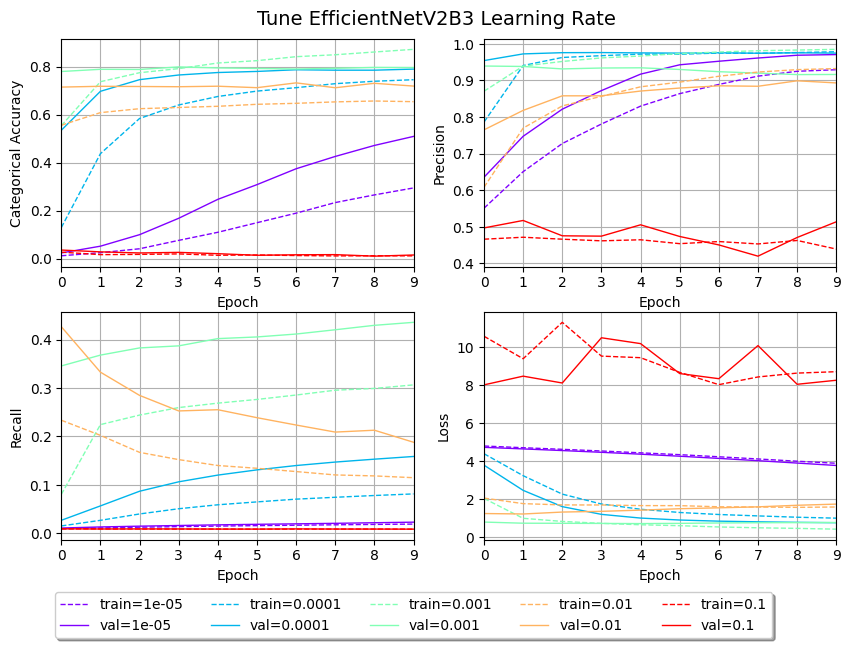

In [40]:
plot_performance(effnetB3_lr_scores, "Tune EfficientNetV2B3 Learning Rate", epochs)

In [41]:
effnetB3_learning_rate = 0.0001

### Tune inner layer

In [42]:
effnetB3_size_scores = {}

for size in [10, 50, 100, 250, 500, 1000]:
    print(size)

    model = make_model(effnetB3_base_model, input_size=299, learning_rate=effnetB3_learning_rate,size_inner=size)
    history = model.fit(effnetB3_train_ds, epochs=10, validation_data=effnetB3_val_ds)
    effnetB3_size_scores[size] = history.history

    print()
    print()

10
Epoch 1/10
412/412 [==============================] - 29s 56ms/step - loss: 4.7464 - categorical_accuracy: 0.0130 - precision_22: 0.0103 - recall_22: 0.5555 - val_loss: 4.6865 - val_categorical_accuracy: 0.0304 - val_precision_22: 0.0137 - val_recall_22: 0.6860
Epoch 2/10
412/412 [==============================] - 21s 50ms/step - loss: 4.6227 - categorical_accuracy: 0.0312 - precision_22: 0.0130 - recall_22: 0.6584 - val_loss: 4.5308 - val_categorical_accuracy: 0.0677 - val_precision_22: 0.0173 - val_recall_22: 0.7604
Epoch 3/10
412/412 [==============================] - 21s 50ms/step - loss: 4.4787 - categorical_accuracy: 0.0417 - precision_22: 0.0150 - recall_22: 0.7035 - val_loss: 4.3624 - val_categorical_accuracy: 0.0932 - val_precision_22: 0.0210 - val_recall_22: 0.7993
Epoch 4/10
412/412 [==============================] - 21s 50ms/step - loss: 4.3497 - categorical_accuracy: 0.0588 - precision_22: 0.0163 - recall_22: 0.7104 - val_loss: 4.1990 - val_categorical_accuracy: 0.1321 

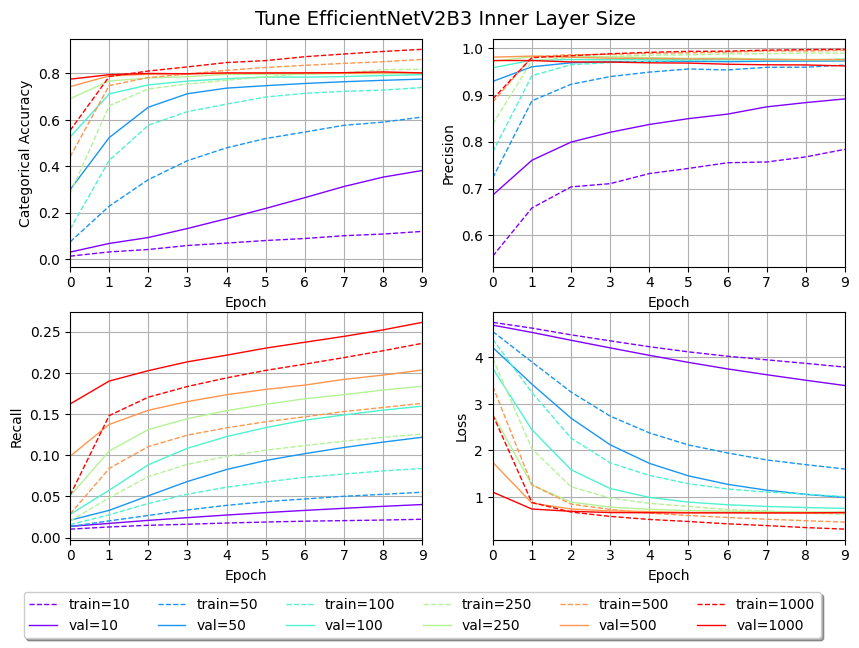

In [43]:
# lr 0.0001
plot_performance(effnetB3_size_scores, "Tune EfficientNetV2B3 Inner Layer Size", epochs)

In [44]:
effnetB3_size_inner = 250

### Tune dropout rate

In [45]:
effnetB3_drop_scores = {}

for drop in [0.25, 0.4, 0.5, 0.6, 0.75]:
    print(drop)

    model = make_model(effnetB3_base_model, input_size=299, learning_rate=effnetB3_learning_rate, size_inner=effnetB3_size_inner,droprate=drop)
    history = model.fit(effnetB3_train_ds, epochs=10, validation_data=effnetB3_val_ds)
    effnetB3_drop_scores[drop] = history.history

    print()
    print()

0.25
Epoch 1/10
412/412 [==============================] - 28s 53ms/step - loss: 3.6209 - categorical_accuracy: 0.4212 - precision_28: 0.0249 - recall_28: 0.8924 - val_loss: 2.1711 - val_categorical_accuracy: 0.7240 - val_precision_28: 0.0603 - val_recall_28: 0.9830
Epoch 2/10
412/412 [==============================] - 20s 50ms/step - loss: 1.4530 - categorical_accuracy: 0.7454 - precision_28: 0.0689 - recall_28: 0.9850 - val_loss: 0.9957 - val_categorical_accuracy: 0.7823 - val_precision_28: 0.1031 - val_recall_28: 0.9842
Epoch 3/10
412/412 [==============================] - 20s 49ms/step - loss: 0.8950 - categorical_accuracy: 0.7855 - precision_28: 0.0955 - recall_28: 0.9870 - val_loss: 0.7978 - val_categorical_accuracy: 0.7926 - val_precision_28: 0.1218 - val_recall_28: 0.9836
Epoch 4/10
412/412 [==============================] - 21s 50ms/step - loss: 0.7481 - categorical_accuracy: 0.7993 - precision_28: 0.1092 - recall_28: 0.9898 - val_loss: 0.7368 - val_categorical_accuracy: 0.795

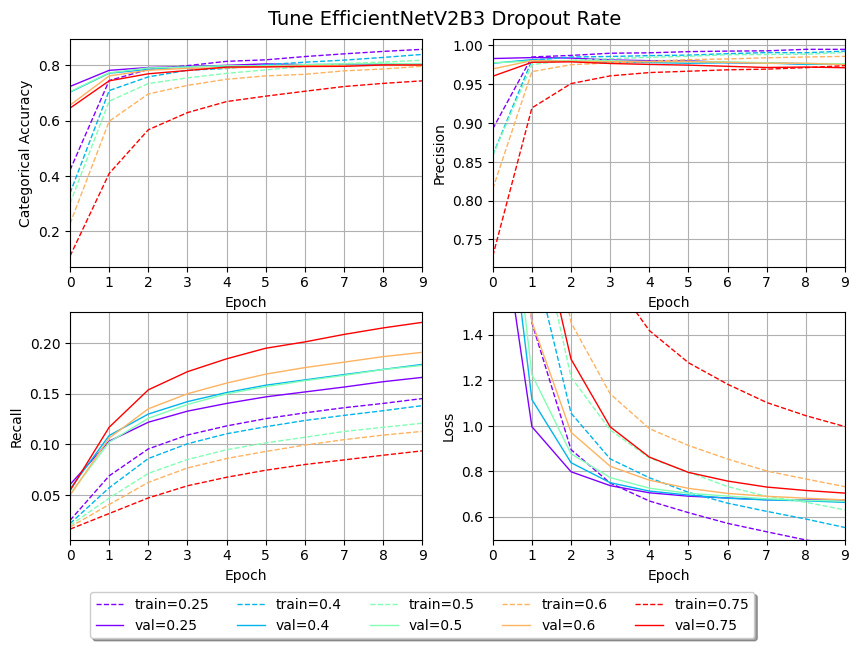

In [46]:
# size 250
plot_performance(effnetB3_drop_scores, "Tune EfficientNetV2B3 Dropout Rate", epochs, loss_lim = [0.5, 1.5])

In [47]:
effnetB3_droprate = 0.6

### Save best model

In [48]:
# image generator for final testing
effnetB3_train_ds_big = effnetB3_gen.flow(X_train_big, y_train_big_tf, batch_size=batch_size)
effnetB3_test_ds_big = effnetB3_gen.flow(X_val_big, y_val_big_tf, batch_size=batch_size)

In [49]:
# create model with begininng layers trainable
model = make_model(effnetB3_base_model, learning_rate=effnetB3_learning_rate, size_inner=effnetB3_size_inner, droprate=effnetB3_droprate)
model = unfreeze_model(model, learning_rate=effnetB3_learning_rate, num_layers=4)

# fit model to training data
effnetB3_train_history = model.fit(
    effnetB3_train_ds_big,
    epochs=20,
    validation_data=effnetB3_test_ds_big
)

Epoch 1/20
412/412 [==============================] - 56s 119ms/step - loss: 3.5215 - categorical_accuracy: 0.4358 - precision_34: 0.0241 - recall_34: 0.9067 - val_loss: 1.9041 - val_categorical_accuracy: 0.8782 - val_precision_34: 0.0965 - val_recall_34: 0.9991
Epoch 2/20
412/412 [==============================] - 48s 115ms/step - loss: 1.2845 - categorical_accuracy: 0.8305 - precision_34: 0.0691 - recall_34: 0.9943 - val_loss: 0.5544 - val_categorical_accuracy: 0.9244 - val_precision_34: 0.1908 - val_recall_34: 0.9988
Epoch 3/20
412/412 [==============================] - 48s 115ms/step - loss: 0.6462 - categorical_accuracy: 0.8796 - precision_34: 0.1091 - recall_34: 0.9964 - val_loss: 0.3291 - val_categorical_accuracy: 0.9271 - val_precision_34: 0.2318 - val_recall_34: 0.9988
Epoch 4/20
412/412 [==============================] - 48s 116ms/step - loss: 0.4674 - categorical_accuracy: 0.8945 - precision_34: 0.1319 - recall_34: 0.9960 - val_loss: 0.2625 - val_categorical_accuracy: 0.9308

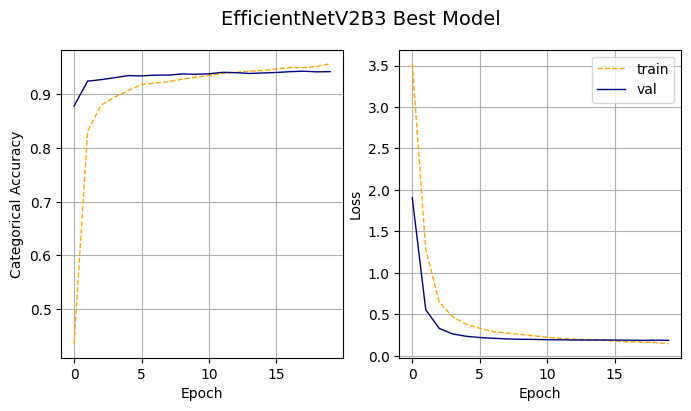

In [51]:
plot_best(effnetB3_train_history.history, title="EfficientNetV2B3 Best Model")

In [52]:
# performance metrics for model comparison
effnetB3_params = model.count_params()
effnetB3_epochs = np.argmax(effnetB3_train_history.history['val_categorical_accuracy'])
effnetB3_train_accuracy = effnetB3_train_history.history['categorical_accuracy'][effnetB3_epochs]
effnetB3_train_loss = effnetB3_train_history.history['loss'][effnetB3_epochs]
effnetB3_val_accuracy = effnetB3_train_history.history['val_categorical_accuracy'][effnetB3_epochs]
effnetB3_val_loss = effnetB3_train_history.history['val_loss'][effnetB3_epochs]

**Retrain model at tuned number of epochs to save**

In [53]:
# create new model
model = make_model(effnetB3_base_model, learning_rate=effnetB3_learning_rate, size_inner=effnetB3_size_inner, droprate=effnetB3_droprate)
model = unfreeze_model(model, learning_rate=effnetB3_learning_rate, num_layers=4)

# fit model to training data with tuned num of epochs to prevent overfitting
start = time()
model.fit(
    effnetB3_train_ds_big,
    epochs=effnetB3_epochs
)
effnetB3_train_time = time() - start
effnetB3_train_time = effnetB3_train_time/epochs

Epoch 1/17
412/412 [==============================] - 45s 94ms/step - loss: 3.5789 - categorical_accuracy: 0.4222 - precision_36: 0.0238 - recall_36: 0.8909
Epoch 2/17
412/412 [==============================] - 39s 94ms/step - loss: 1.3400 - categorical_accuracy: 0.8291 - precision_36: 0.0733 - recall_36: 0.9933
Epoch 3/17
412/412 [==============================] - 39s 94ms/step - loss: 0.6526 - categorical_accuracy: 0.8804 - precision_36: 0.1196 - recall_36: 0.9951
Epoch 4/17
412/412 [==============================] - 39s 94ms/step - loss: 0.4714 - categorical_accuracy: 0.8947 - precision_36: 0.1453 - recall_36: 0.9957
Epoch 5/17
412/412 [==============================] - 39s 94ms/step - loss: 0.3875 - categorical_accuracy: 0.9065 - precision_36: 0.1646 - recall_36: 0.9951
Epoch 6/17
412/412 [==============================] - 39s 94ms/step - loss: 0.3298 - categorical_accuracy: 0.9135 - precision_36: 0.1781 - recall_36: 0.9969
Epoch 7/17
412/412 [==============================] - 39s 

In [54]:
# save model
path = os.path.join('..', 'models', 'effnetV2B3_model.keras')
model.save(path)
#tf.saved_model.save(model, path)

# model size in mb
effnetB3_size = os.stat(path).st_size / (1024 * 1024)

### Final prediction

In [66]:
# load model
path = os.path.join('..', 'models', 'effnetV2B3_model.keras')
effnetB3_model = keras.models.load_model(path)

In [67]:
# image generator with held-out training data for test data prediction
effnetB3_test_ds_big = effnetB3_gen.flow(X_test_big, y_test_big_tf, batch_size=batch_size,shuffle=False)

# compute testing statistics
start = time()
effnetB3_test_predict = effnetB3_model.predict(effnetB3_test_ds_big)
effnetB3_predict_time = time() - start

effnetB3_test_predict = np.argmax(effnetB3_test_predict, axis=1)
effnetB3_accuracy, effnetB3_precision, effnetB3_recall, effnetB3_f1 = accuracy_score(effnetB3_test_predict, y_test_big), precision_score(effnetB3_test_predict, y_test_big, average='macro'), recall_score(effnetB3_test_predict, y_test_big, average='macro'), f1_score(effnetB3_test_predict, y_test_big, average='macro')

129/129 [==============================] - 13s 87ms/step


In [68]:
new_line = "\n"
print(
    f"--- EfficientNetV2B3 Final Info and Statistics ---{new_line}"
    f"-- Tuned parameters --{new_line}"
    f"learning rate: {effnetB3_learning_rate}{new_line}"
    f"inner layer size: {effnetB3_size_inner}{new_line}"
    f"dropout rate: {effnetB3_droprate}{new_line}"
    f"epochs: {effnetB3_epochs+1}{new_line}{new_line}"

    f"-- Model info --{new_line}"
    f"model size: {effnetB3_size:,.3f}{new_line}"
    f"number of parameters: {effnetB3_params}{new_line}{new_line}"

    f"-- Model statistics --{new_line}"
    f"avg train time: {effnetB3_train_time:,.3f}{new_line}"
    f"predict time: {effnetB3_predict_time:,.3f}{new_line}{new_line}"

    f"training accuracy: {effnetB3_train_accuracy:,.3f}{new_line}"
    f"training loss: {effnetB3_train_loss:,.3f}{new_line}{new_line}"
 
    f"validation accuracy: {effnetB3_val_accuracy:,.3f}{new_line}"
    f"validation loss: {effnetB3_val_loss:,.3f}{new_line}{new_line}"
 
    f"test accuracy: {effnetB3_accuracy:,.3f}{new_line}"
    f"test precision: {effnetB3_precision:,.3f}{new_line}"
    f"test recall: {effnetB3_recall:,.3f}{new_line}"
    f"test f1: {effnetB3_f1:,.3f}{new_line}"
)

--- EfficientNetV2B3 Final Info and Statistics ---
-- Tuned parameters --
learning rate: 0.0001
inner layer size: 250
dropout rate: 0.6
epochs: 18

-- Model info --
model size: 54.715
number of parameters: 13344992

-- Model statistics --
avg train time: 66.558
predict time: 13.107

training accuracy: 0.949
training loss: 0.163

validation accuracy: 0.943
validation loss: 0.186

test accuracy: 0.945
test precision: 0.944
test recall: 0.945
test f1: 0.944



In [69]:
new_line = "\n"
print(
    f"effnetB3_learning_rate = {effnetB3_learning_rate}{new_line}"
    f"effnetB3_size_inner = {effnetB3_size_inner}{new_line}"
    f"effnetB3_droprate = {effnetB3_droprate}{new_line}"
    f"effnetB3_epochs = {effnetB3_epochs}{new_line}{new_line}"

    f"effnetB3_size = {effnetB3_size}{new_line}"
    f"effnetB3_params = {effnetB3_params}{new_line}{new_line}"

    f"effnetB3_train_time = {effnetB3_train_time}{new_line}"
    f"effnetB3_predict_time = {effnetB3_predict_time}{new_line}{new_line}"

    f"effnetB3_train_accuracy = {effnetB3_train_accuracy}{new_line}"
    f"effnetB3_train_loss = {effnetB3_train_loss}{new_line}{new_line}"

    f"effnetB3_val_accuracy = {effnetB3_val_accuracy}{new_line}"
    f"effnetB3_val_loss = {effnetB3_val_loss}{new_line}{new_line}"
 
    f"effnetB3_accuracy = {effnetB3_accuracy}{new_line}"
    f"effnetB3_precision = {effnetB3_precision}{new_line}"
    f"effnetB3_recall = {effnetB3_recall}{new_line}"
    f"effnetB3_f1 = {effnetB3_f1}{new_line}"
)

effnetB3_learning_rate = 0.0001
effnetB3_size_inner = 250
effnetB3_droprate = 0.6
effnetB3_epochs = 17

effnetB3_size = 54.714805603027344
effnetB3_params = 13344992

effnetB3_train_time = 66.55805895328521
effnetB3_predict_time = 13.106500148773193

effnetB3_train_accuracy = 0.9494343400001526
effnetB3_train_loss = 0.16325366497039795

effnetB3_val_accuracy = 0.9429091811180115
effnetB3_val_loss = 0.18585605919361115

effnetB3_accuracy = 0.9448493683187561
effnetB3_precision = 0.9444985506803392
effnetB3_recall = 0.9449800930574832
effnetB3_f1 = 0.9436415427878394



## 4.5 Model 4. ConvNeXtSmall

[ConvNeXtSmall Application - Keras](https://keras.io/api/applications/convnext/#convnextsmall-function)

**Reference**
- [A ConvNet for the 2020s](https://arxiv.org/abs/2201.03545) (CVPR 2022)

**Base Model Architecture**

ConvNeXt is a family of architectures that aims to make transformers viable for computer vision, aiding in tasks suck as object detection and semantic segmentation. They outperform other transformers while maintaining the simplicity and efficiency of standard ConvNets. Table 9 from the paper shows the architecture for ConvNeXt-T compared with ResNet-50 () and Swin-T (Ze et al, 2021)[https://arxiv.org/abs/2103.14030]. For differently sized ConvNeXts, only the number of blocks and the number of channels at each stage differ from ConvNeXt-T. The number of channels doubles at each new stage, so ConvNeXt-Small has double the number of channels.

<img src="../figures/convnextsmall-table.PNG" width="500">

In [70]:
convNeXtSm_base_model = tf.keras.applications.convnext.ConvNeXtSmall(
        weights='imagenet',
        include_top=False,
        input_shape=(299, 299, 3)
    )
epochs=10
batch_size=32

In [71]:
# image generator for preprocessing
convNeXtSm_gen = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.convnext.preprocess_input)
convNeXtSm_train_ds = convNeXtSm_gen.flow(X_train, y_train_tf, batch_size=batch_size)
convNeXtSm_val_ds = convNeXtSm_gen.flow(X_val, y_val_tf, batch_size=batch_size)

In [72]:
model = make_model(convNeXtSm_base_model)
model.summary(expand_nested=True)

Model: "model_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_26 (InputLayer)       [(None, 299, 299, 3)]     0         
                                                                 
 convnext_small (Functional)  (None, 9, 9, 768)        49454688  
|¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯|
| input_25 (InputLayer)     [(None, 299, 299, 3)]     0         |
|                                                               |
| convnext_small_prestem_norm  (None, 299, 299, 3)    0         |
| alization (Normalization)                                     |
|                                                               |
| convnext_small_stem (Sequen  (None, 74, 74, 96)     4896      |
| tial)                                                         |
||¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯¯||
|| convnext_small_stem_conv (C  (None, 74, 74, 96)   4704 

### Tune learning rate

In [16]:
convNeXtSm_lr_scores = {}

for lr in [0.00001, 0.0001, 0.001, 0.01, 0.1]:
    print(lr)

    model = make_model(convNeXtSm_base_model, learning_rate=lr)
    history = model.fit(convNeXtSm_train_ds, epochs=epochs, validation_data=convNeXtSm_val_ds)
    convNeXtSm_lr_scores[lr] = history.history

    print()
    print()

1e-05
Epoch 1/10
412/412 [==============================] - 91s 177ms/step - loss: 5.0472 - categorical_accuracy: 0.0129 - precision_1: 0.0092 - recall_1: 0.5618 - val_loss: 4.7435 - val_categorical_accuracy: 0.0334 - val_precision_1: 0.0105 - val_recall_1: 0.6335
Epoch 2/10
412/412 [==============================] - 67s 163ms/step - loss: 4.8105 - categorical_accuracy: 0.0246 - precision_1: 0.0107 - recall_1: 0.6349 - val_loss: 4.5318 - val_categorical_accuracy: 0.0583 - val_precision_1: 0.0125 - val_recall_1: 0.7212
Epoch 3/10
412/412 [==============================] - 66s 161ms/step - loss: 4.5975 - categorical_accuracy: 0.0446 - precision_1: 0.0122 - recall_1: 0.6997 - val_loss: 4.3325 - val_categorical_accuracy: 0.0981 - val_precision_1: 0.0145 - val_recall_1: 0.7971
Epoch 4/10
412/412 [==============================] - 66s 161ms/step - loss: 4.3943 - categorical_accuracy: 0.0674 - precision_1: 0.0138 - recall_1: 0.7663 - val_loss: 4.1409 - val_categorical_accuracy: 0.1713 - val_p

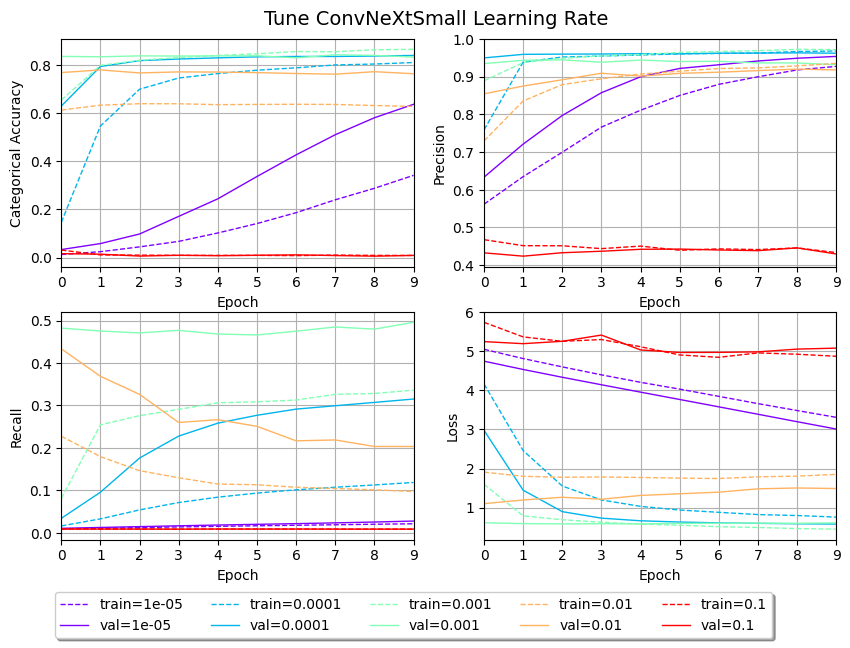

In [17]:
plot_performance(convNeXtSm_lr_scores, "Tune ConvNeXtSmall Learning Rate", epochs)

In [14]:
convNeXtSm_learning_rate = 0.0001

### Tune inner layer

In [15]:
convNeXtSm_size_scores = {}

for size in [10, 50, 100, 250, 500, 1000]:
    print(size)

    model=make_model(convNeXtSm_base_model, learning_rate=convNeXtSm_learning_rate, size_inner=size)
    history = model.fit(convNeXtSm_train_ds, epochs=10, validation_data=convNeXtSm_val_ds)
    convNeXtSm_size_scores[size] = history.history

    print()
    print()

10
Epoch 1/10
412/412 [==============================] - 94s 184ms/step - loss: 4.7502 - categorical_accuracy: 0.0208 - precision_1: 0.0099 - recall_1: 0.5306 - val_loss: 4.6273 - val_categorical_accuracy: 0.0671 - val_precision_1: 0.0135 - val_recall_1: 0.6757
Epoch 2/10
412/412 [==============================] - 67s 163ms/step - loss: 4.5522 - categorical_accuracy: 0.0432 - precision_1: 0.0130 - recall_1: 0.6465 - val_loss: 4.3824 - val_categorical_accuracy: 0.1333 - val_precision_1: 0.0191 - val_recall_1: 0.7722
Epoch 3/10
412/412 [==============================] - 67s 162ms/step - loss: 4.3361 - categorical_accuracy: 0.0608 - precision_1: 0.0156 - recall_1: 0.6706 - val_loss: 4.0967 - val_categorical_accuracy: 0.1862 - val_precision_1: 0.0261 - val_recall_1: 0.8114
Epoch 4/10
412/412 [==============================] - 67s 162ms/step - loss: 4.1349 - categorical_accuracy: 0.0743 - precision_1: 0.0187 - recall_1: 0.6946 - val_loss: 3.8343 - val_categorical_accuracy: 0.2439 - val_prec

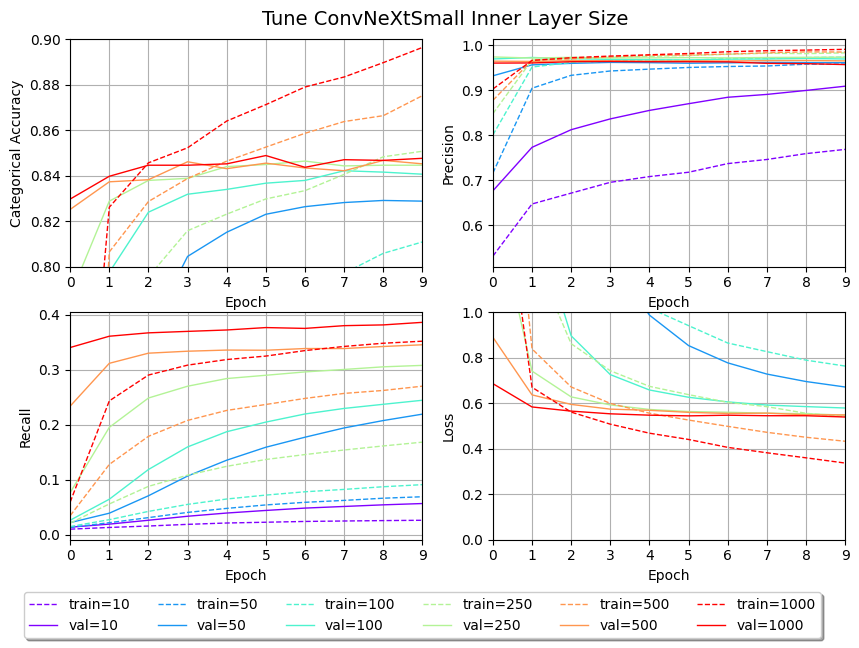

In [20]:
plot_performance(convNeXtSm_size_scores, "Tune ConvNeXtSmall Inner Layer Size", epochs, acc_lim = [0.8,0.9], loss_lim=[0,1])

In [15]:
convNeXtSm_size_inner = 250

### Tune dropout rate

In [22]:
convNeXtSm_drop_scores = {}

for drop in [0.25, 0.4, 0.5, 0.6, 0.75]:
    print(drop)

    model=make_model(convNeXtSm_base_model, learning_rate=convNeXtSm_learning_rate, size_inner=convNeXtSm_size_inner, droprate=drop)
    history = model.fit(convNeXtSm_train_ds, epochs=10, validation_data=convNeXtSm_val_ds)
    convNeXtSm_drop_scores[drop] = history.history

    print()
    print()

0.25
Epoch 1/10
412/412 [==============================] - 79s 169ms/step - loss: 2.9055 - categorical_accuracy: 0.4739 - precision_7: 0.0293 - recall_7: 0.8712 - val_loss: 1.1725 - val_categorical_accuracy: 0.8108 - val_precision_7: 0.1190 - val_recall_7: 0.9626
Epoch 2/10
412/412 [==============================] - 67s 163ms/step - loss: 0.9026 - categorical_accuracy: 0.8113 - precision_7: 0.1168 - recall_7: 0.9676 - val_loss: 0.6871 - val_categorical_accuracy: 0.8263 - val_precision_7: 0.2263 - val_recall_7: 0.9623
Epoch 3/10
412/412 [==============================] - 67s 162ms/step - loss: 0.6603 - categorical_accuracy: 0.8300 - precision_7: 0.1758 - recall_7: 0.9714 - val_loss: 0.6093 - val_categorical_accuracy: 0.8369 - val_precision_7: 0.2669 - val_recall_7: 0.9630
Epoch 4/10
412/412 [==============================] - 68s 164ms/step - loss: 0.5898 - categorical_accuracy: 0.8400 - precision_7: 0.2058 - recall_7: 0.9750 - val_loss: 0.5853 - val_categorical_accuracy: 0.8372 - val_pr

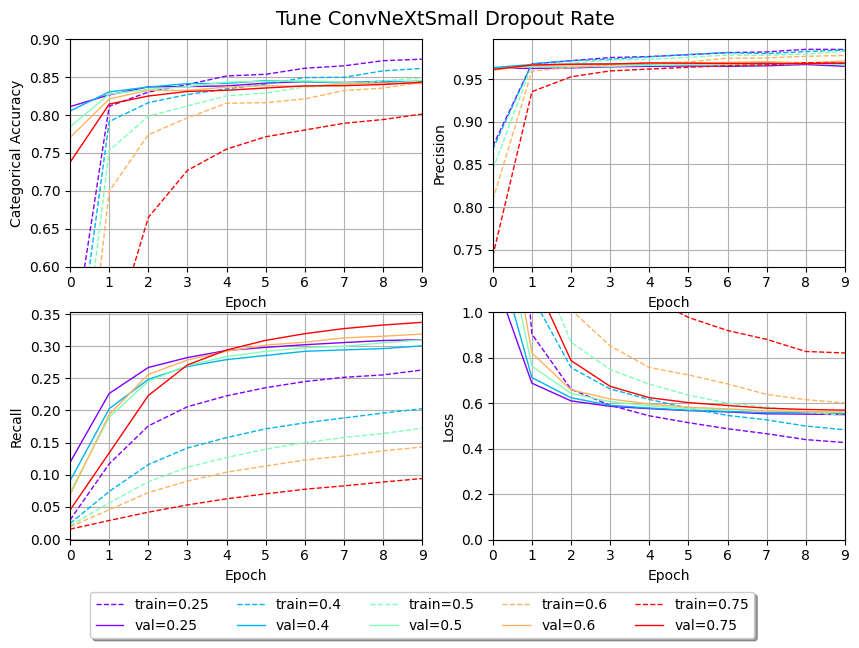

In [25]:
plot_performance(convNeXtSm_drop_scores, "Tune ConvNeXtSmall Dropout Rate", epochs, acc_lim=[0.6,0.9], loss_lim = [0,1])

In [16]:
convNeXtSm_droprate = 0.6

### Save best model

In [17]:
# image generator for epoch tuning and final learning curve analysis
convNeXtSm_train_ds_big = convNeXtSm_gen.flow(X_train_big, y_train_big_tf, batch_size=batch_size)
convNeXtSm_test_ds_big = convNeXtSm_gen.flow(X_val_big, y_val_big_tf, batch_size=batch_size)

In [18]:
# create model with begininng layers trainable
model = make_model(convNeXtSm_base_model, learning_rate=convNeXtSm_learning_rate, size_inner=convNeXtSm_size_inner, droprate=convNeXtSm_droprate)
model = unfreeze_model(model, learning_rate=convNeXtSm_learning_rate, num_layers=4)

# fit model to training data
convNeXtSm_train_history = model.fit(
    convNeXtSm_train_ds_big,
    epochs=20,
    validation_data=convNeXtSm_test_ds_big
)

Epoch 1/20
412/412 [==============================] - 218s 484ms/step - loss: 4.0567 - categorical_accuracy: 0.1842 - precision_2: 0.0184 - recall_2: 0.7629 - val_loss: 2.5340 - val_categorical_accuracy: 0.8351 - val_precision_2: 0.1616 - val_recall_2: 0.9669
Epoch 2/20
412/412 [==============================] - 192s 466ms/step - loss: 1.8954 - categorical_accuracy: 0.6963 - precision_2: 0.0925 - recall_2: 0.9355 - val_loss: 0.8626 - val_categorical_accuracy: 0.9107 - val_precision_2: 0.5803 - val_recall_2: 0.9736
Epoch 3/20
412/412 [==============================] - 192s 466ms/step - loss: 0.9667 - categorical_accuracy: 0.8385 - precision_2: 0.2271 - recall_2: 0.9582 - val_loss: 0.4774 - val_categorical_accuracy: 0.9289 - val_precision_2: 0.6068 - val_recall_2: 0.9803
Epoch 4/20
412/412 [==============================] - 192s 465ms/step - loss: 0.6758 - categorical_accuracy: 0.8743 - precision_2: 0.2880 - recall_2: 0.9667 - val_loss: 0.3588 - val_categorical_accuracy: 0.9305 - val_pre

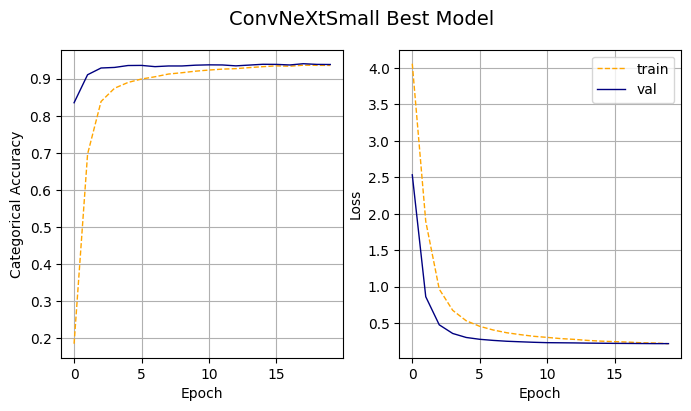

In [19]:
plot_best(convNeXtSm_train_history.history, title="ConvNeXtSmall Best Model")

In [20]:
# performance metrics for model comparison
convNeXtSm_params = model.count_params()
convNeXtSm_epochs = np.argmax(convNeXtSm_train_history.history['val_categorical_accuracy'])
convNeXtSm_train_accuracy = convNeXtSm_train_history.history['categorical_accuracy'][convNeXtSm_epochs]
convNeXtSm_train_loss = convNeXtSm_train_history.history['loss'][convNeXtSm_epochs]
convNeXtSm_val_accuracy = convNeXtSm_train_history.history['val_categorical_accuracy'][convNeXtSm_epochs]
convNeXtSm_val_loss = convNeXtSm_train_history.history['val_loss'][convNeXtSm_epochs]

**Retrain model at tuned number of epochs to save**

In [21]:
# create new model
model = make_model(convNeXtSm_base_model, learning_rate=convNeXtSm_learning_rate, size_inner=convNeXtSm_size_inner, droprate=convNeXtSm_droprate)
model = unfreeze_model(model, learning_rate=convNeXtSm_learning_rate, num_layers=4)

# fit model to training data with tuned num of epochs to prevent overfitting
start = time()
model.fit(
    convNeXtSm_train_ds_big,
    epochs=convNeXtSm_epochs
)
convNeXtSm_train_time = time() - start
convNeXtSm_train_time = convNeXtSm_train_time/epochs

Epoch 1/17
412/412 [==============================] - 164s 374ms/step - loss: 4.0712 - categorical_accuracy: 0.1790 - precision_4: 0.0167 - recall_4: 0.8088
Epoch 2/17
412/412 [==============================] - 155s 376ms/step - loss: 1.9021 - categorical_accuracy: 0.6956 - precision_4: 0.0672 - recall_4: 0.9596
Epoch 3/17
412/412 [==============================] - 154s 373ms/step - loss: 0.9702 - categorical_accuracy: 0.8365 - precision_4: 0.1605 - recall_4: 0.9703
Epoch 4/17
412/412 [==============================] - 158s 382ms/step - loss: 0.6691 - categorical_accuracy: 0.8741 - precision_4: 0.2155 - recall_4: 0.9771
Epoch 5/17
412/412 [==============================] - 159s 386ms/step - loss: 0.5252 - categorical_accuracy: 0.8930 - precision_4: 0.2469 - recall_4: 0.9785
Epoch 6/17
412/412 [==============================] - 157s 381ms/step - loss: 0.4570 - categorical_accuracy: 0.8979 - precision_4: 0.2609 - recall_4: 0.9813
Epoch 7/17
412/412 [==============================] - 156s

In [22]:
# save model
path = os.path.join('..', 'models', 'convNeXtSm_model.keras')
model.save(path)

# model size in mb
convNeXtSm_size = os.stat(path).st_size / (1024 * 1024)

### Final prediction

In [54]:
path = os.path.join('..', 'models', 'convNeXtSm_model.keras')
convNeXtSm_model = tf.keras.models.load_model(path, compile=False, custom_objects={ "LayerScale": convnext.LayerScale, "StochasticDepth": convnext.StochasticDepth } )

In [75]:
# image generator with held-out training data for test data prediction
convNeXtSm_train_hold_ds_big = convNeXtSm_gen.flow(X_train_big_hold, y_train_big_hold_tf, batch_size=batch_size,shuffle=False)
convNeXtSm_test_ds_big = convNeXtSm_gen.flow(X_test_big, y_test_big_tf, batch_size=batch_size,shuffle=False)

In [76]:
# compute testing statistics
start = time()
convNeXtSm_test_predict = convNeXtSm_model.predict(convNeXtSm_test_ds_big)
convNeXtSm_predict_time = time() - start

convNeXtSm_test_predict = np.argmax(convNeXtSm_test_predict, axis=1)
convNeXtSm_accuracy, convNeXtSm_precision, convNeXtSm_recall, convNeXtSm_f1 = accuracy_score(convNeXtSm_test_predict, y_test_big), precision_score(convNeXtSm_test_predict, y_test_big, average='macro'), recall_score(convNeXtSm_test_predict, y_test_big, average='macro'), f1_score(convNeXtSm_test_predict, y_test_big, average='macro')

129/129 [==============================] - 160s 1s/step


In [77]:
new_line = "\n"
print(
    f"--- ConvNeXtSmall Final Info and Statistics ---{new_line}"
    f"-- Tuned parameters --{new_line}"
    f"learning rate: {convNeXtSm_learning_rate}{new_line}"
    f"inner layer size: {convNeXtSm_size_inner}{new_line}"
    f"dropout rate: {convNeXtSm_droprate}{new_line}"
    f"epochs: {convNeXtSm_epochs+1}{new_line}{new_line}"

    f"-- Model info --{new_line}"
    f"model size: {convNeXtSm_size:,.3f}{new_line}"
    f"number of parameters: {convNeXtSm_params}{new_line}{new_line}"

    f"-- Model statistics --{new_line}"
    f"avg train time: {convNeXtSm_train_time:,.3f}{new_line}"
    f"predict time: {convNeXtSm_predict_time:,.3f}{new_line}{new_line}"

    f"training accuracy: {convNeXtSm_train_accuracy:,.3f}{new_line}{new_line}"
    f"training loss: {convNeXtSm_train_loss:,.3f}{new_line}"
 
    f"validation accuracy: {convNeXtSm_val_accuracy:,.3f}{new_line}{new_line}"
    f"validation loss: {convNeXtSm_val_loss:,.3f}{new_line}"
 
    f"test accuracy: {convNeXtSm_accuracy:,.3f}{new_line}"
    f"test precision: {convNeXtSm_precision:,.3f}{new_line}"
    f"test recall: {convNeXtSm_recall:,.3f}{new_line}"
    f"test f1: {convNeXtSm_f1:,.3f}{new_line}"
)

--- ConvNeXtSmall Final Info and Statistics ---
-- Tuned parameters --
learning rate: 0.0001
inner layer size: 250
dropout rate: 0.6
epochs: 18

-- Model info --
model size: 191.716
number of parameters: 49677058

-- Model statistics --
avg train time: 265.549
predict time: 160.441

training accuracy: 0.937

training loss: 0.231
validation accuracy: 0.940

validation loss: 0.221
test accuracy: 0.939
test precision: 0.938
test recall: 0.940
test f1: 0.937



In [59]:
new_line = "\n"
print(
    f"convNeXtSm_learning_rate = {convNeXtSm_learning_rate}{new_line}"
    f"convNeXtSm_size_inner = {convNeXtSm_size_inner}{new_line}"
    f"convNeXtSm_droprate = {convNeXtSm_droprate}{new_line}"
    f"convNeXtSm_epochs = {convNeXtSm_epochs}{new_line}{new_line}"

    f"convNeXtSm_size = {convNeXtSm_size}{new_line}"
    f"convNeXtSm_params = {convNeXtSm_params}{new_line}{new_line}"

    f"convNeXtSm_train_time = {convNeXtSm_train_time}{new_line}"
    f"convNeXtSm_predict_time = {convNeXtSm_predict_time}{new_line}{new_line}"

    f"convNeXtSm_train_accuracy = {convNeXtSm_train_accuracy}{new_line}"
    f"convNeXtSm_train_loss = {convNeXtSm_train_loss}{new_line}{new_line}"

    f"convNeXtSm_val_accuracy = {convNeXtSm_val_accuracy}{new_line}"
    f"convNeXtSm_val_loss = {convNeXtSm_val_loss}{new_line}{new_line}"
 
    f"convNeXtSm_accuracy = {convNeXtSm_accuracy}{new_line}"
    f"convNeXtSm_precision = {convNeXtSm_precision}{new_line}"
    f"convNeXtSm_recall = {convNeXtSm_recall}{new_line}"
    f"convNeXtSm_f1 = {convNeXtSm_f1}{new_line}"
)

convNeXtSm_learning_rate = 0.0001
convNeXtSm_size_inner = 250
convNeXtSm_droprate = 0.6
convNeXtSm_epochs = 17

convNeXtSm_size = 191.71595001220703
convNeXtSm_params = 49677058

convNeXtSm_train_time = 265.54887053966524
convNeXtSm_predict_time = 53.77896285057068

convNeXtSm_train_accuracy = 0.9365271925926208
convNeXtSm_train_loss = 0.23138511180877686

convNeXtSm_val_accuracy = 0.9404798150062561
convNeXtSm_val_loss = 0.2210197001695633

convNeXtSm_accuracy = 0.9385325558794947
convNeXtSm_precision = 0.9381103861144144
convNeXtSm_recall = 0.9397048973817755
convNeXtSm_f1 = 0.9372003088427144



## 4.6 Compare all models

EfficientNetB3V2 is our best performing model across all metrics. It also has the smallest size and a relatively small number of parameters, so we can assume it will run fairly fast.

In [79]:
df = pl.DataFrame(
    {
        'Model': ['Xception', 'InceptionResNetV2', 'EfficientNetB3', 'ConvNeXtSmall'],
        'Learning rate': [xception_learning_rate, inception_learning_rate, effnetB3_learning_rate, convNeXtSm_learning_rate],
        'Inner layer size': [xception_size_inner, inception_size_inner, effnetB3_size_inner, convNeXtSm_size_inner],
        'Dropout rate': [xception_droprate, inception_droprate, effnetB3_droprate, convNeXtSm_droprate],
        'Epochs': [xception_epochs, inception_epochs, effnetB3_epochs, convNeXtSm_epochs],

        'Model size (MB)': [xception_size, inception_size, effnetB3_size, convNeXtSm_size],
        'Parameters': [xception_params, inception_params, effnetB3_params, convNeXtSm_params],

        'Train Accuracy': [xception_train_accuracy, inception_train_accuracy, effnetB3_train_accuracy, convNeXtSm_train_accuracy],
        'Train Loss': [xception_train_loss, inception_train_loss, effnetB3_train_loss, convNeXtSm_train_loss],
        
        'Validation Accuracy': [xception_val_accuracy, inception_val_accuracy, effnetB3_val_accuracy, convNeXtSm_val_accuracy],
        'Validation Loss': [xception_val_loss, inception_val_loss, effnetB3_val_loss, convNeXtSm_val_loss],
        
        'Test Accuracy': [xception_accuracy, inception_accuracy, effnetB3_accuracy, convNeXtSm_accuracy],
        'Test Precision': [xception_precision, inception_precision, effnetB3_precision, convNeXtSm_precision],
        'Test Recall': [xception_recall, inception_recall, effnetB3_recall, convNeXtSm_recall],
        'Test f1': [xception_f1, inception_f1, effnetB3_f1, convNeXtSm_f1]
    }
)

In [80]:
pl.Config(tbl_hide_dataframe_shape=True, tbl_hide_column_data_types=True, fmt_str_lengths=20)

In [81]:
df

Model,Learning rate,Inner layer size,Dropout rate,Epochs,Model size (MB),Parameters,Train Accuracy,Train Loss,Validation Accuracy,Validation Loss,Test Accuracy,Test Precision,Test Recall,Test f1
"""Xception""",0.0001,100,0.4,13,82.332954,21078500,0.875408,0.442491,0.896447,0.346427,0.900632,0.898146,0.899739,0.896681
"""InceptionResNetV2""",0.0001,100,0.4,14,210.371216,11197905,0.909346,0.321885,0.918919,0.275441,0.919582,0.916935,0.920634,0.91618
"""EfficientNetB3""",0.0001,250,0.6,17,54.714806,13344992,0.949434,0.163254,0.942909,0.185856,0.944849,0.944499,0.94498,0.943642
"""ConvNeXtSmall""",0.0001,250,0.6,17,191.71595,49677058,0.936527,0.231385,0.94048,0.22102,0.938533,0.93811,0.939705,0.9372


## 4.7 Save best model with TFLite

### save model

In [82]:
path = os.path.join('..', 'models', 'effnetV2B3_model.keras')
effnetB3_model = keras.models.load_model(path)

In [83]:
converter = tf.lite.TFLiteConverter.from_keras_model(effnetB3_model)

tflite_model = converter.convert()
outpath = os.path.join('..', 'models', 'model.tflite')

with open(outpath, 'wb') as f_out:
    f_out.write(tflite_model)

INFO:tensorflow:Assets written to: C:\Users\lenni\AppData\Local\Temp\tmpgni5_3wa\assets


INFO:tensorflow:Assets written to: C:\Users\lenni\AppData\Local\Temp\tmpgni5_3wa\assets


### test image

In [85]:
from tensorflow.keras.applications.efficientnet_v2 import preprocess_input

In [86]:
image = os.path.join('..', 'data', 'images', 'Images', 'n02085620-Chihuahua', 'n02085620_199.jpg')
img = load_img(image, target_size=(299,299))
X = preprocess_input(np.array([img], dtype='float32'))

In [87]:
X.shape

(1, 299, 299, 3)

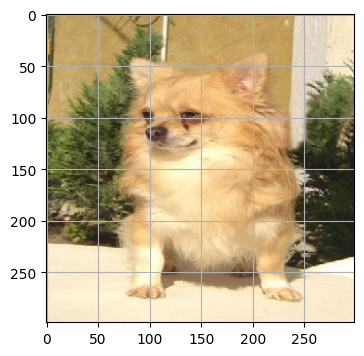

In [88]:
fig, axs = plt.subplots(1,1, figsize=(4,4))
axs.imshow(img)

In [89]:
# load tflite model
interpreter = tflite.Interpreter(model_path=outpath)
interpreter.allocate_tensors()

In [90]:
interpreter.get_input_details()

[{'name': 'serving_default_input_35:0',
  'index': 0,
  'shape': array([  1, 299, 299,   3]),
  'shape_signature': array([ -1, 299, 299,   3]),
  'dtype': numpy.float32,
  'quantization': (0.0, 0),
  'quantization_parameters': {'scales': array([], dtype=float32),
   'zero_points': array([], dtype=int32),
   'quantized_dimension': 0},
  'sparsity_parameters': {}}]

In [91]:
interpreter.get_output_details()

[{'name': 'StatefulPartitionedCall:0',
  'index': 788,
  'shape': array([  1, 120]),
  'shape_signature': array([ -1, 120]),
  'dtype': numpy.float32,
  'quantization': (0.0, 0),
  'quantization_parameters': {'scales': array([], dtype=float32),
   'zero_points': array([], dtype=int32),
   'quantized_dimension': 0},
  'sparsity_parameters': {}}]

In [92]:
# index for inputs and outputs
input_index = interpreter.get_input_details()[0]['index']
output_index = interpreter.get_output_details()[0]['index']

In [93]:
# compute predictions with model
interpreter.set_tensor(input_index, X)
interpreter.invoke()
preds = interpreter.get_tensor(output_index)

Looking at the predictions for both the original model and tflite, we can see they both predict the image correctly as a chihuahua

In [94]:
categories[np.argmax(preds)]

'Chihuahua'

In [95]:
categories[np.argmax(effnetB3_model.predict(X))]

1/1 [==============================] - 2s 2s/step


'Chihuahua'

In [96]:
dict(zip(categories, preds[0]))

{'Chihuahua': 5.54814,
 'Japanese spaniel': -1.0086241,
 'Maltese dog': -5.300613,
 'Pekinese': -0.3510011,
 'Shih tzu': -5.0783596,
 'Blenheim spaniel': -4.247279,
 'Papillon': -0.2773252,
 'Toy terrier': -2.6894333,
 'Rhodesian ridgeback': -8.208132,
 'Afghan hound': -7.508516,
 'Basset': -9.196249,
 'Beagle': -6.6974916,
 'Bloodhound': -8.3160095,
 'Bluetick': -10.315333,
 'Black and tan coonhound': -7.518436,
 'Walker hound': -7.1642027,
 'English foxhound': -6.6245666,
 'Redbone': -9.158252,
 'Borzoi': -7.544806,
 'Irish wolfhound': -7.465827,
 'Italian greyhound': -7.306961,
 'Whippet': -6.705671,
 'Ibizan hound': -6.587814,
 'Norwegian elkhound': -5.9745293,
 'Otterhound': -7.2284656,
 'Saluki': -6.628244,
 'Scottish deerhound': -6.2286344,
 'Weimaraner': -8.711171,
 'Staffordshire bullterrier': -5.5977387,
 'American staffordshire terrier': -6.974511,
 'Bedlington terrier': -10.700234,
 'Border terrier': -5.7726774,
 'Kerry blue terrier': -7.129769,
 'Irish terrier': -7.6280756

### remove tensorflow dependencies

We can skip efficientnetv2 preprocess_input, because according to the [sourcecode](https://github.com/keras-team/keras/blob/master/keras/applications/efficientnet_v2.py):
The preprocessing logic has been included in the EfficientNetV2 model implementation. Users are no longer required to call this method to normalize the input data.

In [97]:
from PIL import Image

with Image.open(image) as img:
    img = img.resize((299, 299), Image.NEAREST)

X = np.array([img], dtype='float32')

In [98]:
interpreter.set_tensor(input_index, X)
interpreter.invoke()
preds = interpreter.get_tensor(output_index)
categories[np.argmax(preds)]

'Chihuahua'

The following also removes dependency of the full tensorflow package, however, this notebook runs on windows with python 3.10 to support other dependencies. tflite is no longer supported past python 3.9, so I'm skipping the following step and will remove tensorflow dependencies from the docker container before deployment.

In [157]:
!pip install --extra-index-url https://google-coral.github.io/py-repo/ tflite_runtime

Looking in indexes: https://pypi.org/simple, https://google-coral.github.io/py-repo/


ERROR: Could not find a version that satisfies the requirement tflite_runtime (from versions: none)
ERROR: No matching distribution found for tflite_runtime


In [150]:
import tflite_runtime.interpreter as tflite

ModuleNotFoundError: No module named 'tflite_runtime'

# 5. Deployment

## 5.1 Local Deployment

To deploy locally, navigate up to the root folder and run the following from a terminal or command prompt. Please note that docker must already be installed on your local machine. See the [official documentation](https://docs.docker.com/engine/install/) for Docker Engine installation.

- Build the container: `docker build -t dog-prediction .`
- Run the container: `docker run -it --rm -p 8080:8080 dog-prediction:latest`

This will build an image from the [dockerfile](../Dockerfile) using python 3.10, tflite and [lambda_function.py](lambda_function.py). Once the container is running, you should be able to execute the following commands to recieve a prediction from a web-hosted image. The code is exported to [test.py](test.py) and can be run from the python folder with the command `python test.py`.

In [89]:
import requests

url = 'http://localhost:8080/2015-03-31/functions/function/invocations'

data = {'url': 'https://upload.wikimedia.org/wikipedia/commons/8/8b/Redbone-coonhound-detail.jpg'}

result = requests.post(url, json=data).json()

In [90]:
result

'Redbone'

The following also runs [test.py](test.py)

In [91]:
%run -i "test.py"

Redbone


## 5.2 Cloud Deployment

The model is deployed to an AWS Lambda function hosted by a docker image on AWS EC2. The following now posts to the AWS cloud model instead.

In [103]:
import requests

url = "https://hciuk807s3.execute-api.us-east-2.amazonaws.com/test/predict"

data = {'url': 'https://upload.wikimedia.org/wikipedia/commons/8/8b/Redbone-coonhound-detail.jpg'}

result = requests.post(url, json=data).json()
print(result)

Redbone


# 6. Kubernetes

## 6.1 Docker

To test our kubernetes deployment for the cloud, we first set up a multi-container environment with docker-compose.

In [25]:
import tensorflow as tf
from tensorflow import keras

import grpc
from tensorflow_serving.apis import predict_pb2
from tensorflow_serving.apis import prediction_service_pb2_grpc

#import requests
#import base64
from io import BytesIO
from PIL import Image
from urllib import request

### Save model to tensorflow format

Save keras model to tensorflow format

Use saved_model_cli to check for info we'll need to use later when serving the model
- **Signature definition**: 'serving_default'
- **Input**: 'input_35'
- **Output**: 'dense_65'

In [6]:
path = os.path.join('..', 'models', 'effnetV2B3_model.keras')
effnetB3_model = keras.models.load_model(path)
tf.saved_model.save(effnetB3_model, os.path.join('..', 'models', 'converted_model'))

INFO:tensorflow:Assets written to: ..\models\converted_model\assets


INFO:tensorflow:Assets written to: ..\models\converted_model\assets


In [8]:
!saved_model_cli show --dir ../models/converted_model --all


MetaGraphDef with tag-set: 'serve' contains the following SignatureDefs:

signature_def['__saved_model_init_op']:
  The given SavedModel SignatureDef contains the following input(s):
  The given SavedModel SignatureDef contains the following output(s):
    outputs['__saved_model_init_op'] tensor_info:
        dtype: DT_INVALID
        shape: unknown_rank
        name: NoOp
  Method name is: 

signature_def['serving_default']:
  The given SavedModel SignatureDef contains the following input(s):
    inputs['input_35'] tensor_info:
        dtype: DT_FLOAT
        shape: (-1, 299, 299, 3)
        name: serving_default_input_35:0
  The given SavedModel SignatureDef contains the following output(s):
    outputs['dense_65'] tensor_info:
        dtype: DT_FLOAT
        shape: (-1, 120)
        name: StatefulPartitionedCall:0
  Method name is: tensorflow/serving/predict

Concrete Functions:
  Function Name: '__call__'
    Option #1
      Callable with:
        Argument #1
          inputs: Ten

### Model container from command line/terminal

First we can run a simple container for serving our model from the command line or terminal. See below for a range of commands for different OS's

Windows powershell:

> docker run -it --rm -p 8500:8500 -v "$(pwd)/converted_model:/models/converted_model/1" -e MODEL_NAME="converted_model" tensorflow/serving:2.7.0

Windows command line:

> docker run -it --rm ^
    -p 8500:8500 ^
    -v "%cd%/converted_model:/models/converted_model/1" ^
    -e MODEL_NAME="converted_model" ^
    tensorflow/serving:2.7.0

Mac silicon:

> docker run -it --rm -p 8500:8500 -v "$(pwd)/converted_model:/models/converted_model/1" -e MODEL_NAME="converted_model" tensorflow/serving:2.7.0

Next we need to test that our model is served correctly. We'll use gRPC to start up a communication channel at the port that the model is locally hosted on (8500), then send our input data to that channel to recieve the results.
- tf-serving makes use of gRPC, a framework for connecting services in and across datacenters
- gRPC uses *Protocol Buffers* (AKA ***Protobuf***) for formatting data, a kind of binary encoding which is faster and more efficient than JSON.
- gRPC can establish both insecure and secure communication channels. Secure channels can make use of authentication and other advanced security features, but since our model server won't be accessible from the outside, insecure channels are adequate for our use case.
- The *stub* is our interface with the tf-serving inorder to make inference with our model. It needs a channel as a parameter to establish the communication.

In [125]:
host = 'localhost:8500'
channel = grpc.insecure_channel(host)
stub = prediction_service_pb2_grpc.PredictionServiceStub(channel)

The following blocks download an image and convert it into a numpy array for sending to the model

In [126]:
def download_image(url):
    with request.urlopen(url) as resp:
        buffer = resp.read()
    stream = BytesIO(buffer)
    img = Image.open(stream)
    return img

In [127]:
def batch_image(img):
    if img.mode != 'RGB':
        img = img.convert('RGB')
        
    img = img.resize((299, 299), Image.NEAREST)    
    X = np.array(img, dtype='float32')
    batch = np.expand_dims(X, axis=0)

    return batch

In [128]:
image_url = "https://upload.wikimedia.org/wikipedia/commons/4/4b/Golden_retriever_running_on_a_dirt_road.jpg"
img = download_image(image_url)
X = batch_image(img)

Set up our request to our model by: 
- Instancing a Protobuf request object and defining its model name, the model's signature name (input_35) that we saw before and its input.
- Convert the numpy array of our image to Protobuf format and copy it to the request object.

Inference is done with the stub's Predict() method. Returns a protobuf response object that access our predictions with the name of the aoutput that we found in the signature definition (dense_65).

In [129]:
def np_to_protobuf(data):
    return tf.make_tensor_proto(data, shape=data.shape)

pb_request = predict_pb2.PredictRequest()
pb_request.model_spec.name = 'converted_model'
pb_request.model_spec.signature_name = 'serving_default'
pb_request.inputs['input_35'].CopyFrom(np_to_protobuf(X))

In [132]:
pb_response = stub.Predict(pb_request, timeout=20.0)
preds = pb_response.outputs['dense_65'].float_val

In [133]:
classes = ['Chihuahua', 'Japanese spaniel', 'Maltese dog', 'Pekinese', 'Shih tzu', 'Blenheim spaniel', 'Papillon', 'Toy terrier', 'Rhodesian ridgeback', 'Afghan hound', 'Basset', 'Beagle', 'Bloodhound', 'Bluetick', 'Black and tan coonhound', 'Walker hound', 'English foxhound', 'Redbone', 'Borzoi', 'Irish wolfhound', 'Italian greyhound', 'Whippet', 'Ibizan hound', 'Norwegian elkhound', 'Otterhound', 'Saluki', 'Scottish deerhound', 'Weimaraner', 'Staffordshire bullterrier', 'American staffordshire terrier', 'Bedlington terrier', 'Border terrier', 'Kerry blue terrier', 'Irish terrier', 'Norfolk terrier', 'Norwich terrier', 'Yorkshire terrier', 'Wire haired fox terrier', 'Lakeland terrier', 'Sealyham terrier', 'Airedale', 'Cairn', 'Australian terrier', 'Dandie dinmont', 'Boston bull', 'Miniature schnauzer', 'Giant schnauzer', 'Standard schnauzer', 'Scotch terrier', 'Tibetan terrier', 'Silky terrier', 'Soft coated wheaten terrier', 'West highland white terrier', 'Lhasa', 'Flat coated retriever', 'Curly coated retriever', 'Golden retriever', 'Labrador retriever', 'Chesapeake bay retriever', 'German short haired pointer', 'Vizsla', 'English setter', 'Irish setter', 'Gordon setter', 'Brittany spaniel', 'Clumber', 'English springer', 'Welsh springer spaniel', 'Cocker spaniel', 'Sussex spaniel', 'Irish water spaniel', 'Kuvasz', 'Schipperke', 'Groenendael', 'Malinois', 'Briard', 'Kelpie', 'Komondor', 'Old english sheepdog', 'Shetland sheepdog', 'Collie', 'Border collie', 'Bouvier des flandres', 'Rottweiler', 'German shepherd', 'Doberman', 'Miniature pinscher', 'Greater swiss mountain dog', 'Bernese mountain dog', 'Appenzeller', 'Entlebucher', 'Boxer', 'Bull mastiff', 'Tibetan mastiff', 'French bulldog', 'Great dane', 'Saint bernard', 'Eskimo dog', 'Malamute', 'Siberian husky', 'Affenpinscher', 'Basenji', 'Pug', 'Leonberg', 'Newfoundland', 'Great pyrenees', 'Samoyed', 'Pomeranian', 'Chow', 'Keeshond', 'Brabancon griffon', 'Pembroke', 'Cardigan', 'Toy poodle', 'Miniature poodle', 'Standard poodle', 'Mexican hairless', 'Dingo', 'Dhole', 'African hunting dog']
dict_predictions = dict(zip(classes, preds))
top_5 = sorted(dict_predictions.items(), key=lambda x:x[1], reverse=True)[:5]
top_5

[('Golden retriever', 4.919919967651367),
 ('Kuvasz', 1.704106330871582),
 ('Great pyrenees', 0.6640768051147461),
 ('Labrador retriever', -0.6828897595405579),
 ('Border collie', -0.936854898929596)]

### Model serving container from Dockerfile

- Create a simple dockerfile with tf-serving. It's saved to the kubernetes folder as [image-model.dockerfile](../kubernetes/image-model.dockerfile).
  - Points to the [converted_model](../models/converted_model) directory
- Build the container
- Run at port 8500

**DOCKERFILE**

> FROM tensorflow/serving:2.7.0
> 
> COPY models/converted_model models/converted_model/1
> 
> ENV MODEL_NAME="converted_model"

**BUILD**
> docker build -t dog-prediction-model:v1 -f kubernetes/image-model.dockerfile .

**RUN**
> docker run -it --rm -p 8500:8500 dog-prediction-model:v1

Test it again

In [134]:
pb_response = stub.Predict(pb_request, timeout=20.0)
preds = pb_response.outputs['dense_65'].float_val

classes = ['Chihuahua', 'Japanese spaniel', 'Maltese dog', 'Pekinese', 'Shih tzu', 'Blenheim spaniel', 'Papillon', 'Toy terrier', 'Rhodesian ridgeback', 'Afghan hound', 'Basset', 'Beagle', 'Bloodhound', 'Bluetick', 'Black and tan coonhound', 'Walker hound', 'English foxhound', 'Redbone', 'Borzoi', 'Irish wolfhound', 'Italian greyhound', 'Whippet', 'Ibizan hound', 'Norwegian elkhound', 'Otterhound', 'Saluki', 'Scottish deerhound', 'Weimaraner', 'Staffordshire bullterrier', 'American staffordshire terrier', 'Bedlington terrier', 'Border terrier', 'Kerry blue terrier', 'Irish terrier', 'Norfolk terrier', 'Norwich terrier', 'Yorkshire terrier', 'Wire haired fox terrier', 'Lakeland terrier', 'Sealyham terrier', 'Airedale', 'Cairn', 'Australian terrier', 'Dandie dinmont', 'Boston bull', 'Miniature schnauzer', 'Giant schnauzer', 'Standard schnauzer', 'Scotch terrier', 'Tibetan terrier', 'Silky terrier', 'Soft coated wheaten terrier', 'West highland white terrier', 'Lhasa', 'Flat coated retriever', 'Curly coated retriever', 'Golden retriever', 'Labrador retriever', 'Chesapeake bay retriever', 'German short haired pointer', 'Vizsla', 'English setter', 'Irish setter', 'Gordon setter', 'Brittany spaniel', 'Clumber', 'English springer', 'Welsh springer spaniel', 'Cocker spaniel', 'Sussex spaniel', 'Irish water spaniel', 'Kuvasz', 'Schipperke', 'Groenendael', 'Malinois', 'Briard', 'Kelpie', 'Komondor', 'Old english sheepdog', 'Shetland sheepdog', 'Collie', 'Border collie', 'Bouvier des flandres', 'Rottweiler', 'German shepherd', 'Doberman', 'Miniature pinscher', 'Greater swiss mountain dog', 'Bernese mountain dog', 'Appenzeller', 'Entlebucher', 'Boxer', 'Bull mastiff', 'Tibetan mastiff', 'French bulldog', 'Great dane', 'Saint bernard', 'Eskimo dog', 'Malamute', 'Siberian husky', 'Affenpinscher', 'Basenji', 'Pug', 'Leonberg', 'Newfoundland', 'Great pyrenees', 'Samoyed', 'Pomeranian', 'Chow', 'Keeshond', 'Brabancon griffon', 'Pembroke', 'Cardigan', 'Toy poodle', 'Miniature poodle', 'Standard poodle', 'Mexican hairless', 'Dingo', 'Dhole', 'African hunting dog']
dict_predictions = dict(zip(classes, preds))
top_5 = sorted(dict_predictions.items(), key=lambda x:x[1], reverse=True)[:5]
top_5

[('Golden retriever', 4.919919967651367),
 ('Kuvasz', 1.704106330871582),
 ('Great pyrenees', 0.6640768051147461),
 ('Labrador retriever', -0.6828897595405579),
 ('Border collie', -0.936854898929596)]

This code is also saved to a testing python file

In [172]:
!python ../kubernetes/test.py -t serving

[('Golden retriever', 4.919919967651367), ('Kuvasz', 1.704106330871582), ('Great pyrenees', 0.6640768051147461), ('Labrador retriever', -0.6828897595405579), ('Border collie', -0.936854898929596)]


### Gateway container from Dockerfile

- Create a dockerfile for the gateway with flask front-end. It's saved to the kubernetes folder as [image-gateway.dockerfile](../kubernetes/image-gateway.dockerfile).
  - Builds the environment with [Pipfile](../kubernetes/Pipfile) and [Pipfile.lock](../kubernetes/Pipfile.lock)
  - Uses the python files [gateway.py](../kubernetes/gateway.py) and [proto.py](../kubernetes/proto.py) for prediction
- Build the container
- Run at port 9696

Next create a dockerfile for our gateway. It's saved to the kubernetes folder as [image-model.dockerfile](../kubernetes/image-model.dockerfile).

**DOCKERFILE**
> FROM python:3.8.12-slim
> 
> RUN pip install pipenv
> 
> WORKDIR /app
> 
> COPY ["Pipfile", "Pipfile.lock", "./"]
> 
> RUN pipenv install --system --deploy
> 
> COPY ["gateway.py", "proto.py". "./"]
> 
> EXPOSE 9696
> 
> ENTRYPOINT ["gunicorn", "--bind=0.0.0.0:9696", "gateway:app"]

**BUILD**

> docker build -t dog-prediction-gateway:v1 -f kubernetes/image-gateway.dockerfile .

**RUN**

> docker run -it --rm -p 9696:9696 dog-prediction-gateway:v1



The following will currently fail with grpc_status 14, meaning that the gateway at port 9696 cannot locate and connect to the serving model at port 8500. We solve this using docker compose to connect the two ports within one multi-container network.

In [143]:
import requests

url = 'http://localhost:9696/predict'

data = {'url': image_url}

result = requests.post(url, json=data)
print(result)

<Response [500]>


### Multi-container network with Docker Compose

To connect the gateway (port 9696) to the serving model (port 8500), start a virtual network using docker-compose. The following is saved to [docker-compose.yaml](../kubernetes/docker-compose.yaml).

**DOCKERFILE**

>version: "3.9" <br>
>services: <br>
>&emsp; dog-model: <br>
>&emsp; &emsp; image: dog-prediction-model:v1 <br>
>&emsp; gateway: <br>
>&emsp; &emsp; image: dog-prediction-gateway:v1 <br>
>&emsp; &emsp; environment: <br>
>&emsp; &emsp; &emsp; - TF_SERVING_HOST=dog-model:8500 <br>
>&emsp; &emsp; ports: <br>
>&emsp; &emsp; &emsp; - "9696:9696" <br>

**RUN**
> docker-compose up

**SHUT DOWN**
> docker-compose down

Now while the multi-container network is running, the following blocks will ping the gateway, which will then ping the model to return the predictions.

In [185]:
import requests

url = 'http://localhost:9696/predict'

data = {'url': image_url}

result = requests.post(url, json=data).json()
result

[['Golden retriever', 4.919919967651367],
 ['Kuvasz', 1.704106330871582],
 ['Great pyrenees', 0.6640768051147461],
 ['Labrador retriever', -0.6828897595405579],
 ['Border collie', -0.936854898929596]]

In [187]:
!python ../kubernetes/test.py -t gateway

[['Golden retriever', 4.919919967651367], ['Kuvasz', 1.704106330871582], ['Great pyrenees', 0.6640768051147461], ['Labrador retriever', -0.6828897595405579], ['Border collie', -0.936854898929596]]


### Local kubernetes cluster

1. Install kubectl, the kubernetes command line tool. **Note** that Docker Desktop for both Windows and MacOS already includes kubectl. Installation instructions for all major platforms are available in the [official Kubernetes website](https://kubernetes.io/docs/tasks/tools/).
2. Install kind, which lets you create local kubernetes clusters with Docker. Installation instructions are available on the [official website](https://kind.sigs.k8s.io/docs/user/quick-start/).

Kubernetes can deploy, manage, and scale applications from docker images

# 7. Application Deployment

## 7.1 Streamlit Application

# 7. References

1. Chollet, François (2016). _“xception: Deep Learning with Depthwise Separable Convolutions”_. In: CoRR abs/1610.02357. arXiv: 1610.02357. url: [http://
arxiv.org/abs/1610.02357](http://arxiv.org/abs/1610.02357).

2. Szegedy, Christian, Ioffe, Sergey, and Vanhoucke, Vincent (2016). _“Inception-v4, Inception-ResNet and the Impact of Residual Connections on Learning”_. In: CoRR abs/1602.07261. arXiv: 1602.07261. url: [http://arxiv.org/abs/1602.07261](https://arxiv.org/abs/1602.07261).
   
3. Sandler, Mark, Howard, Andrew G., Zhu, Menglong, Zhmoginov, Andrey, and Chen, Liang-Chieh (2018). _“Inverted Residuals and Linear Bottlenecks: Mobile Networks for Classification, Detection and Segmentation”_. In: CoRR abs/1801.04381. arXiv: 1801 . 04381. url: [https://arxiv.org/abs/1801.04381](https://arxiv.org/abs/1801.04381).
   
4. Tan, Mingxing, Chen, Bo, Pang, Ruoming, Vasudevan, Vijay, Sandler, Mark, Howard, Andrew, and Le, Quoc V. (2019). _MnasNet: Platform-Aware Neural Architecture Search for Mobile_. arXiv: [1807.11626 \[cs.CV\]](https://arxiv.org/abs/1807.11626).

5. Tan, Mingxing and Le, Quoc V. (2020). _EfficientNet: Rethinking Model Scaling for Convolutional Neural Networks_. arXiv: [1905.11946 \[cs.LG\]](https://arxiv.org/abs/1905.11946).

6. Liu, Ze, Lin, Yutong, Cao, Yue, Hu, Han, Wei, Yixuan, Zhang, Zheng, Lin, Stephen, and Guo, Baining (2021). _Swin Transformer: Hierarchical Vision Transformer using Shifted Windows_. arXiv: [2103.14030 \[cs.CV\]](https://arxiv.org/abs/2103.14030).

7. Liu, Zhuang, Mao, Hanzi, Wu, Chao-Yuan, Feichtenhofer, Christoph, Darrell, Trevor, and Xie, Saining (2022). _“A ConvNet for the 2020s”_. In: CoRR abs/2201.03545. arXiv: 2201 . 03545. url: [https://arxiv.org/abs/2201.03545](https://arxiv.org/abs/2201.03545)

8. Aditya Khosla, Nityananda Jayadevaprakash, Bangpeng Yao and Li Fei-Fei. Novel dataset for Fine-Grained Image Categorization. First Workshop on Fine-Grained Visual Categorization (FGVC), IEEE Conference on Computer Vision and Pattern Recognition (CVPR), 2011.

9. J. Deng, W. Dong, R. Socher, L.-J. Li, K. Li and L. Fei-Fei, ImageNet: A Large-Scale Hierarchical Image Database. IEEE Computer Vision and Pattern Recognition (CVPR), 2009.
    
10. Fu, Y. (2020, June 30). Keras documentation: Image Classification via fine-tuning with EfficientNet. [https://keras.io/examples/vision/image_classification_efficientnet_fine_tuning/](https://keras.io/examples/vision/image_classification_efficientnet_fine_tuning/)